# Mechanisms of Action (MoA) Prediction Part I - Preparation and EDA

## 1. Project Overview

The Connectivity Map, a project within the Broad Institute of MIT and Harvard, the Laboratory for Innovation Science at Harvard (LISH), and the NIH Common Funds Library of Integrated Network-Based Cellular Signatures (LINCS), present this challenge with the goal of advancing drug development through improvements to MoA prediction algorithms.

**What is the Mechanism of Action (MoA) of a drug? And why is it important?**

In the past, scientists derived drugs from natural products or were inspired by traditional remedies. Very common drugs, such as paracetamol, known in the US as acetaminophen, were put into clinical use decades before the biological mechanisms driving their pharmacological activities were understood. Today, with the advent of more powerful technologies, drug discovery has changed from the serendipitous approaches of the past to a more targeted model based on an understanding of the underlying biological mechanism of a disease. In this new framework, scientists seek to identify a protein target associated with a disease and develop a molecule that can modulate that protein target. As a shorthand to describe the biological activity of a given molecule, scientists assign a label referred to as mechanism-of-action or MoA for short.

**How do we determine the MoAs of a new drug?**

One approach is to treat a sample of human cells with the drug and then analyze the cellular responses with algorithms that search for similarity to known patterns in large genomic databases, such as libraries of gene expression or cell viability patterns of drugs with known MoAs.

**How to evaluate the accuracy of a solution?**

Based on the MoA annotations, the accuracy of solutions will be evaluated on the average value of the **logarithmic loss function** applied to each drug-MoA annotation pair.

<math xmlns="http://www.w3.org/1998/Math/MathML" display="block">
  <msub>
    <mi>L</mi>
    <mrow data-mjx-texclass="ORD">
      <mi>log</mi>
    </mrow>
  </msub>
  <mo stretchy="false">(</mo>
  <mi>y</mi>
  <mo>,</mo>
  <mi>p</mi>
  <mo stretchy="false">)</mo>
  <mo>=</mo>
  <mo>&#x2212;</mo>
  <mo stretchy="false">(</mo>
  <mi>y</mi>
  <mi>log</mi>
  <mo data-mjx-texclass="NONE">&#x2061;</mo>
  <mo stretchy="false">(</mo>
  <mi>p</mi>
  <mo stretchy="false">)</mo>
  <mo>+</mo>
  <mo stretchy="false">(</mo>
  <mn>1</mn>
  <mo>&#x2212;</mo>
  <mi>y</mi>
  <mo stretchy="false">)</mo>
  <mi>log</mi>
  <mo data-mjx-texclass="NONE">&#x2061;</mo>
  <mo stretchy="false">(</mo>
  <mn>1</mn>
  <mo>&#x2212;</mo>
  <mi>p</mi>
  <mo stretchy="false">)</mo>
  <mo stretchy="false">)</mo>
</math>

In [4]:
# standard import 

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import os
import warnings
warnings.filterwarnings('ignore')
style='ggplot'

pd.options.display.max_columns=None

## 2. Data Analysis & EDA

### 2.1 Train & Test data Overview

In [5]:
data_dir='../input/lish-moa/'
os.listdir(data_dir)

['train_targets_scored.csv',
 'sample_submission.csv',
 'train_drug.csv',
 'train_targets_nonscored.csv',
 'train_features.csv',
 'test_features.csv']

In [6]:
train=pd.read_csv(data_dir+'train_features.csv')
test=pd.read_csv(data_dir+'test_features.csv')

train['data_set']='train'
test['data_set']='test'

df=pd.concat([train,test])

`train_features.csv `:

Features for the training set. Features g- signify gene expression data, and c- signify cell viability data. cp_type indicates samples treated with a compound (cp_vehicle) or with a control perturbation (ctrl_vehicle); control perturbations have no MoAs; cp_time and cp_dose indicate treatment duration (24, 48, 72 hours) and dose (high or low).

In [7]:
train.head()

,sig_id,cp_type,cp_time,cp_dose,g-0,g-1,g-2,g-3,g-4,g-5,g-6,g-7,g-8,g-9,g-10,g-11,g-12,g-13,g-14,g-15,g-16,g-17,g-18,g-19,g-20,g-21,g-22,g-23,g-24,g-25,g-26,g-27,g-28,g-29,g-30,g-31,g-32,g-33,g-34,g-35,g-36,g-37,g-38,g-39,g-40,g-41,g-42,g-43,g-44,g-45,g-46,g-47,g-48,g-49,g-50,g-51,g-52,g-53,g-54,g-55,g-56,g-57,g-58,g-59,g-60,g-61,g-62,g-63,g-64,g-65,g-66,g-67,g-68,g-69,g-70,g-71,g-72,g-73,g-74,g-75,g-76,g-77,g-78,g-79,g-80,g-81,g-82,g-83,g-84,g-85,g-86,g-87,g-88,g-89,g-90,g-91,g-92,g-93,g-94,g-95,g-96,g-97,g-98,g-99,g-100,g-101,g-102,g-103,g-104,g-105,g-106,g-107,g-108,g-109,g-110,g-111,g-112,g-113,g-114,g-115,g-116,g-117,g-118,g-119,g-120,g-121,g-122,g-123,g-124,g-125,g-126,g-127,g-128,g-129,g-130,g-131,g-132,g-133,g-134,g-135,g-136,g-137,g-138,g-139,g-140,g-141,g-142,g-143,g-144,g-145,g-146,g-147,g-148,g-149,g-150,g-151,g-152,g-153,g-154,g-155,g-156,g-157,g-158,g-159,g-160,g-161,g-162,g-163,g-164,g-165,g-166,g-167,g-168,g-169,g-170,g-171,g-172,g-173,g-174,g-175,g-176,g-177,g-178,g-179,g-180,g-181,g-182,g-183,g-184,g-185,g-186,g-187,g-188,g-189,g-190,g-191,g-192,g-193,g-194,g-195,g-196,g-197,g-198,g-199,g-200,g-201,g-202,g-203,g-204,g-205,g-206,g-207,g-208,g-209,g-210,g-211,g-212,g-213,g-214,g-215,g-216,g-217,g-218,g-219,g-220,g-221,g-222,g-223,g-224,g-225,g-226,g-227,g-228,g-229,g-230,g-231,g-232,g-233,g-234,g-235,g-236,g-237,g-238,g-239,g-240,g-241,g-242,g-243,g-244,g-245,g-246,g-247,g-248,g-249,g-250,g-251,g-252,g-253,g-254,g-255,g-256,g-257,g-258,g-259,g-260,g-261,g-262,g-263,g-264,g-265,g-266,g-267,g-268,g-269,g-270,g-271,g-272,g-273,g-274,g-275,g-276,g-277,g-278,g-279,g-280,g-281,g-282,g-283,g-284,g-285,g-286,g-287,g-288,g-289,g-290,g-291,g-292,g-293,g-294,g-295,g-296,g-297,g-298,g-299,g-300,g-301,g-302,g-303,g-304,g-305,g-306,g-307,g-308,g-309,g-310,g-311,g-312,g-313,g-314,g-315,g-316,g-317,g-318,g-319,g-320,g-321,g-322,g-323,g-324,g-325,g-326,g-327,g-328,g-329,g-330,g-331,g-332,g-333,g-334,g-335,g-336,g-337,g-338,g-339,g-340,g-341,g-342,g-343,g-344,g-345,g-346,g-347,g-348,g-349,g-350,g-351,g-352,g-353,g-354,g-355,g-356,g-357,g-358,g-359,g-360,g-361,g-362,g-363,g-364,g-365,g-366,g-367,g-368,g-369,g-370,g-371,g-372,g-373,g-374,g-375,g-376,g-377,g-378,g-379,g-380,g-381,g-382,g-383,g-384,g-385,g-386,g-387,g-388,g-389,g-390,g-391,g-392,g-393,g-394,g-395,g-396,g-397,g-398,g-399,g-400,g-401,g-402,g-403,g-404,g-405,g-406,g-407,g-408,g-409,g-410,g-411,g-412,g-413,g-414,g-415,g-416,g-417,g-418,g-419,g-420,g-421,g-422,g-423,g-424,g-425,g-426,g-427,g-428,g-429,g-430,g-431,g-432,g-433,g-434,g-435,g-436,g-437,g-438,g-439,g-440,g-441,g-442,g-443,g-444,g-445,g-446,g-447,g-448,g-449,g-450,g-451,g-452,g-453,g-454,g-455,g-456,g-457,g-458,g-459,g-460,g-461,g-462,g-463,g-464,g-465,g-466,g-467,g-468,g-469,g-470,g-471,g-472,g-473,g-474,g-475,g-476,g-477,g-478,g-479,g-480,g-481,g-482,g-483,g-484,g-485,g-486,g-487,g-488,g-489,g-490,g-491,g-492,g-493,g-494,g-495,g-496,g-497,g-498,g-499,g-500,g-501,g-502,g-503,g-504,g-505,g-506,g-507,g-508,g-509,g-510,g-511,g-512,g-513,g-514,g-515,g-516,g-517,g-518,g-519,g-520,g-521,g-522,g-523,g-524,g-525,g-526,g-527,g-528,g-529,g-530,g-531,g-532,g-533,g-534,g-535,g-536,g-537,g-538,g-539,g-540,g-541,g-542,g-543,g-544,g-545,g-546,g-547,g-548,g-549,g-550,g-551,g-552,g-553,g-554,g-555,g-556,g-557,g-558,g-559,g-560,g-561,g-562,g-563,g-564,g-565,g-566,g-567,g-568,g-569,g-570,g-571,g-572,g-573,g-574,g-575,g-576,g-577,g-578,g-579,g-580,g-581,g-582,g-583,g-584,g-585,g-586,g-587,g-588,g-589,g-590,g-591,g-592,g-593,g-594,g-595,g-596,g-597,g-598,g-599,g-600,g-601,g-602,g-603,g-604,g-605,g-606,g-607,g-608,g-609,g-610,g-611,g-612,g-613,g-614,g-615,g-616,g-617,g-618,g-619,g-620,g-621,g-622,g-623,g-624,g-625,g-626,g-627,g-628,g-629,g-630,g-631,g-632,g-633,g-634,g-635,g-636,g-637,g-638,g-639,g-640,g-641,g-642,g-643,g-644,g-645,g-646,g-647,g-648,g-649,g-650,g-651,g-652,g-653,g-654,g-655,g-656,g-657,g-658,g-659,g-660,g-661,g-662,g-663,g-664,g-665,g-666,g-667,g-668,g-669,g-670,g-671,g-672,g-673,g-674,g-675,g-676,g-677,g-678,g-67

`test_features.csv` :

Features for the test data. You must predict the probability of each scored MoA for each row in the test data.

In [8]:
test.head()

,sig_id,cp_type,cp_time,cp_dose,g-0,g-1,g-2,g-3,g-4,g-5,g-6,g-7,g-8,g-9,g-10,g-11,g-12,g-13,g-14,g-15,g-16,g-17,g-18,g-19,g-20,g-21,g-22,g-23,g-24,g-25,g-26,g-27,g-28,g-29,g-30,g-31,g-32,g-33,g-34,g-35,g-36,g-37,g-38,g-39,g-40,g-41,g-42,g-43,g-44,g-45,g-46,g-47,g-48,g-49,g-50,g-51,g-52,g-53,g-54,g-55,g-56,g-57,g-58,g-59,g-60,g-61,g-62,g-63,g-64,g-65,g-66,g-67,g-68,g-69,g-70,g-71,g-72,g-73,g-74,g-75,g-76,g-77,g-78,g-79,g-80,g-81,g-82,g-83,g-84,g-85,g-86,g-87,g-88,g-89,g-90,g-91,g-92,g-93,g-94,g-95,g-96,g-97,g-98,g-99,g-100,g-101,g-102,g-103,g-104,g-105,g-106,g-107,g-108,g-109,g-110,g-111,g-112,g-113,g-114,g-115,g-116,g-117,g-118,g-119,g-120,g-121,g-122,g-123,g-124,g-125,g-126,g-127,g-128,g-129,g-130,g-131,g-132,g-133,g-134,g-135,g-136,g-137,g-138,g-139,g-140,g-141,g-142,g-143,g-144,g-145,g-146,g-147,g-148,g-149,g-150,g-151,g-152,g-153,g-154,g-155,g-156,g-157,g-158,g-159,g-160,g-161,g-162,g-163,g-164,g-165,g-166,g-167,g-168,g-169,g-170,g-171,g-172,g-173,g-174,g-175,g-176,g-177,g-178,g-179,g-180,g-181,g-182,g-183,g-184,g-185,g-186,g-187,g-188,g-189,g-190,g-191,g-192,g-193,g-194,g-195,g-196,g-197,g-198,g-199,g-200,g-201,g-202,g-203,g-204,g-205,g-206,g-207,g-208,g-209,g-210,g-211,g-212,g-213,g-214,g-215,g-216,g-217,g-218,g-219,g-220,g-221,g-222,g-223,g-224,g-225,g-226,g-227,g-228,g-229,g-230,g-231,g-232,g-233,g-234,g-235,g-236,g-237,g-238,g-239,g-240,g-241,g-242,g-243,g-244,g-245,g-246,g-247,g-248,g-249,g-250,g-251,g-252,g-253,g-254,g-255,g-256,g-257,g-258,g-259,g-260,g-261,g-262,g-263,g-264,g-265,g-266,g-267,g-268,g-269,g-270,g-271,g-272,g-273,g-274,g-275,g-276,g-277,g-278,g-279,g-280,g-281,g-282,g-283,g-284,g-285,g-286,g-287,g-288,g-289,g-290,g-291,g-292,g-293,g-294,g-295,g-296,g-297,g-298,g-299,g-300,g-301,g-302,g-303,g-304,g-305,g-306,g-307,g-308,g-309,g-310,g-311,g-312,g-313,g-314,g-315,g-316,g-317,g-318,g-319,g-320,g-321,g-322,g-323,g-324,g-325,g-326,g-327,g-328,g-329,g-330,g-331,g-332,g-333,g-334,g-335,g-336,g-337,g-338,g-339,g-340,g-341,g-342,g-343,g-344,g-345,g-346,g-347,g-348,g-349,g-350,g-351,g-352,g-353,g-354,g-355,g-356,g-357,g-358,g-359,g-360,g-361,g-362,g-363,g-364,g-365,g-366,g-367,g-368,g-369,g-370,g-371,g-372,g-373,g-374,g-375,g-376,g-377,g-378,g-379,g-380,g-381,g-382,g-383,g-384,g-385,g-386,g-387,g-388,g-389,g-390,g-391,g-392,g-393,g-394,g-395,g-396,g-397,g-398,g-399,g-400,g-401,g-402,g-403,g-404,g-405,g-406,g-407,g-408,g-409,g-410,g-411,g-412,g-413,g-414,g-415,g-416,g-417,g-418,g-419,g-420,g-421,g-422,g-423,g-424,g-425,g-426,g-427,g-428,g-429,g-430,g-431,g-432,g-433,g-434,g-435,g-436,g-437,g-438,g-439,g-440,g-441,g-442,g-443,g-444,g-445,g-446,g-447,g-448,g-449,g-450,g-451,g-452,g-453,g-454,g-455,g-456,g-457,g-458,g-459,g-460,g-461,g-462,g-463,g-464,g-465,g-466,g-467,g-468,g-469,g-470,g-471,g-472,g-473,g-474,g-475,g-476,g-477,g-478,g-479,g-480,g-481,g-482,g-483,g-484,g-485,g-486,g-487,g-488,g-489,g-490,g-491,g-492,g-493,g-494,g-495,g-496,g-497,g-498,g-499,g-500,g-501,g-502,g-503,g-504,g-505,g-506,g-507,g-508,g-509,g-510,g-511,g-512,g-513,g-514,g-515,g-516,g-517,g-518,g-519,g-520,g-521,g-522,g-523,g-524,g-525,g-526,g-527,g-528,g-529,g-530,g-531,g-532,g-533,g-534,g-535,g-536,g-537,g-538,g-539,g-540,g-541,g-542,g-543,g-544,g-545,g-546,g-547,g-548,g-549,g-550,g-551,g-552,g-553,g-554,g-555,g-556,g-557,g-558,g-559,g-560,g-561,g-562,g-563,g-564,g-565,g-566,g-567,g-568,g-569,g-570,g-571,g-572,g-573,g-574,g-575,g-576,g-577,g-578,g-579,g-580,g-581,g-582,g-583,g-584,g-585,g-586,g-587,g-588,g-589,g-590,g-591,g-592,g-593,g-594,g-595,g-596,g-597,g-598,g-599,g-600,g-601,g-602,g-603,g-604,g-605,g-606,g-607,g-608,g-609,g-610,g-611,g-612,g-613,g-614,g-615,g-616,g-617,g-618,g-619,g-620,g-621,g-622,g-623,g-624,g-625,g-626,g-627,g-628,g-629,g-630,g-631,g-632,g-633,g-634,g-635,g-636,g-637,g-638,g-639,g-640,g-641,g-642,g-643,g-644,g-645,g-646,g-647,g-648,g-649,g-650,g-651,g-652,g-653,g-654,g-655,g-656,g-657,g-658,g-659,g-660,g-661,g-662,g-663,g-664,g-665,g-666,g-667,g-668,g-669,g-670,g-671,g-672,g-673,g-674,g-675,g-676,g-677,g-678,g-67

In [9]:
print('Number of rows in training set:', train.shape[0])
print('Number of columns in training set:', train.shape[1] - 1)

print('Number of rows in test set:', test.shape[0])
print('Number of columns in test set:', test.shape[1] - 1)

Number of rows in training set: 23814
Number of columns in training set: 876
Number of rows in test set: 3982
Number of columns in test set: 876


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27796 entries, 0 to 3981
Columns: 877 entries, sig_id to data_set
dtypes: float64(872), int64(1), object(4)
memory usage: 186.2+ MB


872 float features

1 integer feature (`cp_time`)

3 categorical features (`sig_id`, `cp_type`, `cp_dose`)

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27796 entries, 0 to 3981
Columns: 877 entries, sig_id to data_set
dtypes: float64(872), int64(1), object(4)
memory usage: 186.2+ MB


### 2.2 Categorical Data Analysis


3 categorical features (`sig_id`, `cp_type`, `cp_dose`)

In [12]:
df_cat=df.groupby(['cp_type','data_set'])['sig_id'].count().reset_index()
df_cat.head()

,cp_type,data_set,sig_id
0,ctl_vehicle,test,358
1,ctl_vehicle,train,1866
2,trt_cp,test,3624
3,trt_cp,train,21948


In [13]:
df_cat.columns=['cp_type','data_set','count']

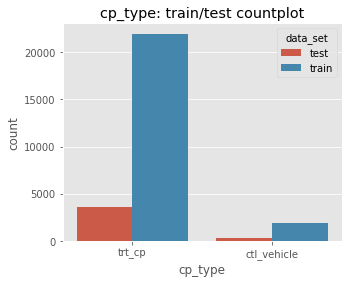

In [14]:
plt.style.use(style)
plt.figure(figsize=(5,4))
plt.title('cp_type: train/test countplot')
sns.countplot(x='cp_type',hue='data_set',hue_order=['test','train'],data=df);

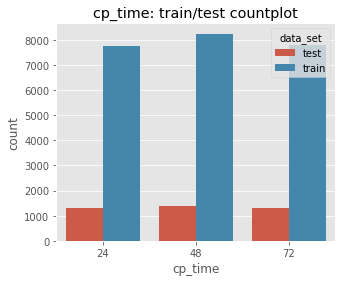

In [15]:
plt.style.use(style)
plt.figure(figsize=(5,4))
plt.title('cp_time: train/test countplot')
sns.countplot(x='cp_time',hue='data_set',hue_order=['test','train'],data=df);

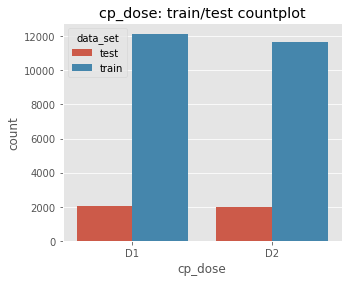

In [16]:
plt.style.use(style)
plt.figure(figsize=(5,4))
plt.title('cp_dose: train/test countplot')
sns.countplot(x='cp_dose',hue='data_set',hue_order=['test','train'],data=df);

In [17]:
ds=df[df['data_set']=='train']
ds=ds.groupby(['cp_type','cp_time','cp_dose'])['sig_id'].count().reset_index()

ds.columns=['cp_type','cp_time','cp_dose','count']

fig=px.sunburst(
    ds,
    path=['cp_type','cp_time','cp_dose'],
    values='count',
    title='Sunburst chart for training set',
    width=500,
    height=500)

fig.show()

### 2.3 Numerical Data Analysis

In [18]:
train_columns=train.columns.to_list()
train_columns[:10]

['sig_id',
 'cp_type',
 'cp_time',
 'cp_dose',
 'g-0',
 'g-1',
 'g-2',
 'g-3',
 'g-4',
 'g-5']

In [19]:
# find gene and cell features
g_list=[i for i in train_columns if i.startswith('g-')]
c_list=[i for i in train_columns if i.startswith('c-')]
print(g_list[:5])
print(c_list[:5])

['g-0', 'g-1', 'g-2', 'g-3', 'g-4']
['c-0', 'c-1', 'c-2', 'c-3', 'c-4']


772 gene features and 100 cell features in total.

In [20]:
len(g_list),len(c_list)

(772, 100)

#### 2.3.1 Cell Viability


Cell viability is a measure of the proportion of live, healthy cells within a population. Cell viability assays are used to determine the overall health of cells, optimize culture or experimental conditions, and to measure cell survival following treatment with compounds, such as during a drug screen.

Cell-viability assessment is based on PRISM technology. PRISM is a high-throughput screen for assessing cell viability in which cell lines that have each been labelled with a unique 24-nucleotide barcode are pooled and treated with the experimental condition, and surviving cells are “counted” through identification of the cognate barcode. PRISM is an acronym for Profiling Relative Inhibition Simultaneously in Mixture.

There are 100 cell-viability features and they have c- prefix (c-0 to c-99). Each cell-viability feature represents viability of one particular cell line, and all experiments are based on a set of similar cells. These are mostly cancer cells.

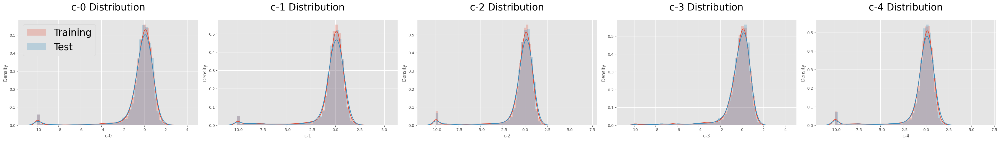

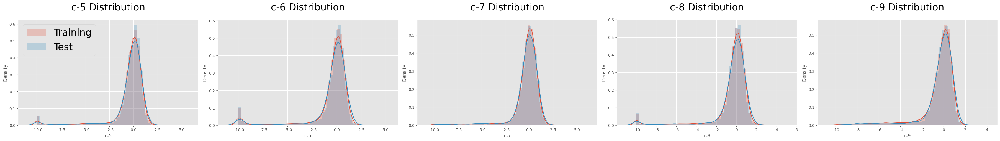

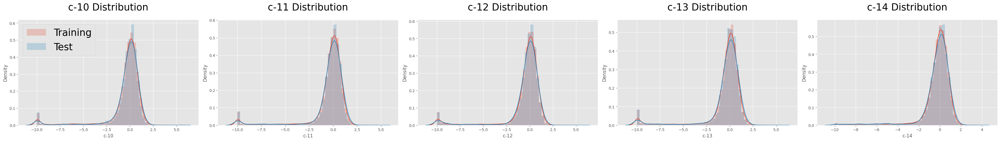

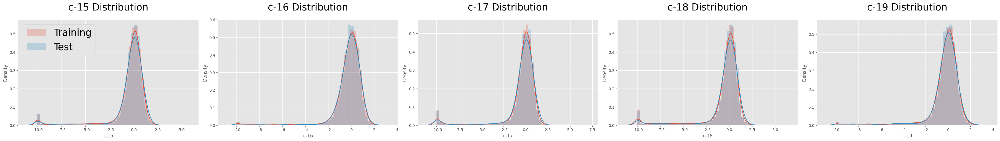

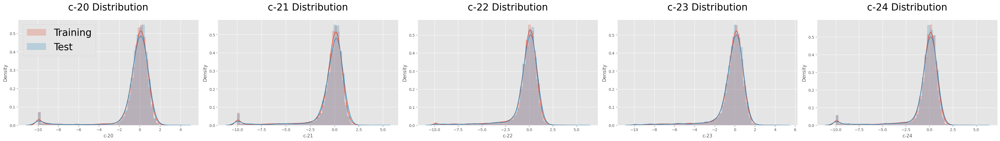

...

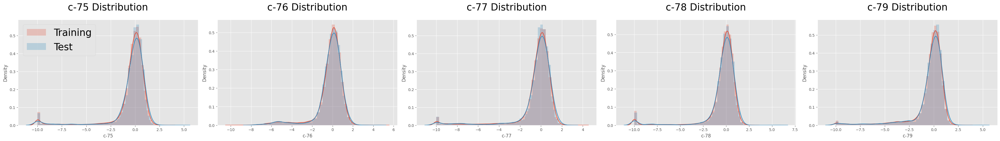

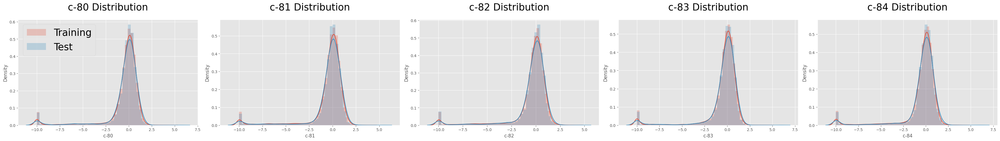

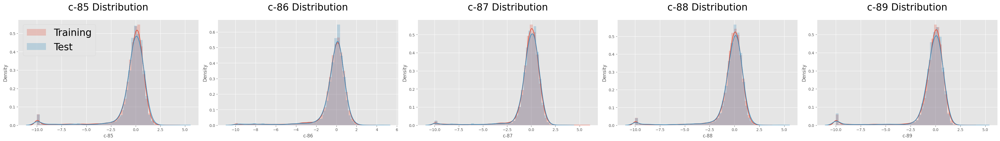

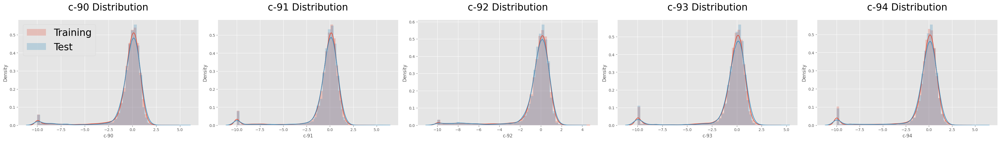

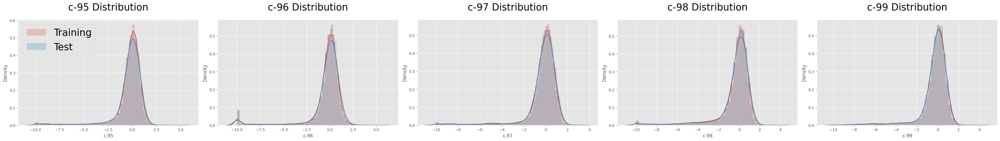

In [21]:
def distplot_cfeature(feature_group):
        
    fig, axes = plt.subplots(ncols=5, figsize=(36, 5), dpi=100, constrained_layout=True)
    title_size = 25
    label_size = 25

    for i, feature in enumerate(feature_group):
        sns.distplot(train[feature], label='Training', ax=axes[i], hist_kws={'alpha': 0.25})
        sns.distplot(test[feature], label='Test', ax=axes[i], hist_kws={'alpha': 0.25})
        
        if i % 5 == 0:
            axes[i].legend(prop={'size': 25})
            
        axes[i].set_title(f'{feature} Distribution', size=title_size, pad=title_size)
    
    plt.show()
    
for feature_group in np.array_split(c_list, len(c_list) // 5):

    distplot_cfeature(feature_group)

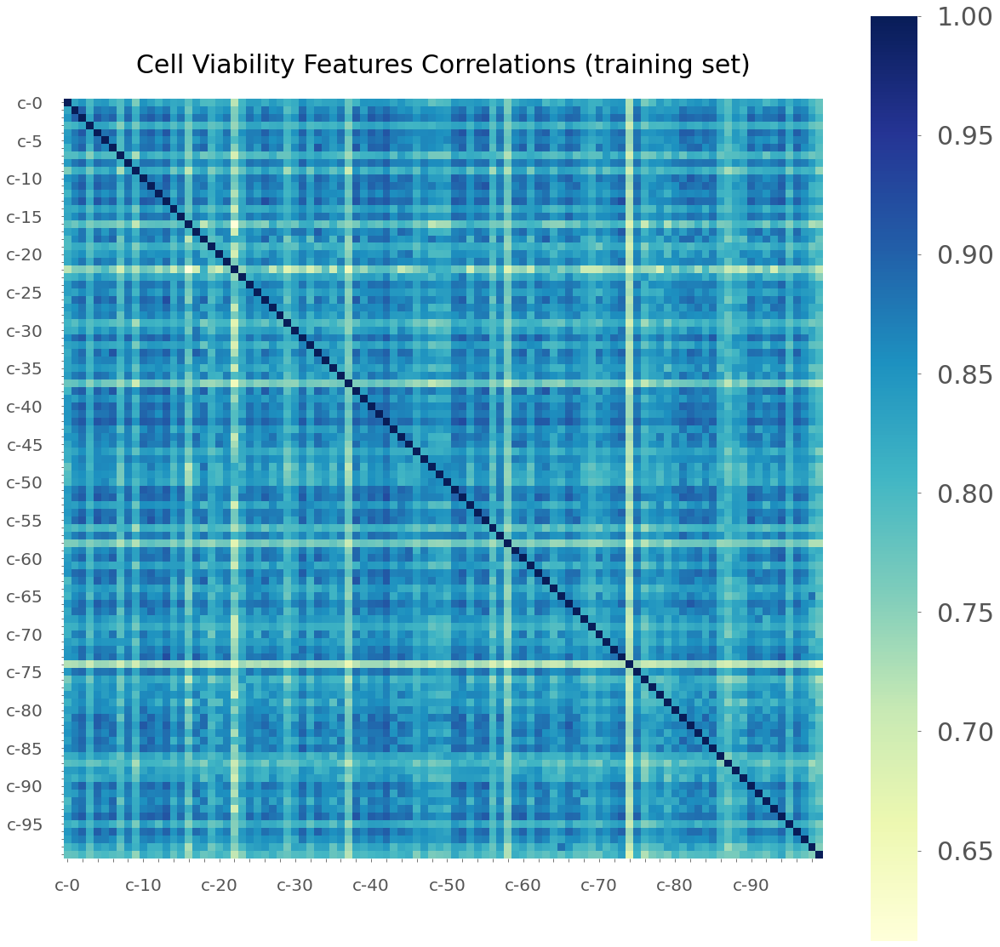

In [22]:
fig = plt.figure(figsize=(20, 20))

ax = sns.heatmap(train[c_list].corr(),
                 annot=False,
                 square=True,
                 cmap="YlGnBu")

ax.tick_params(axis='x', labelsize=20, rotation=0, pad=20)
ax.tick_params(axis='y', labelsize=20, rotation=0, pad=20)

for idx, label in enumerate(ax.get_xticklabels()):
    if idx % 5 == 0:
        label.set_visible(True)
    else:
        label.set_visible(False)
        
for idx, label in enumerate(ax.get_yticklabels()):
    if idx % 5 == 0:
        label.set_visible(True)
    else:
        label.set_visible(False)
        
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=30, pad=20)

plt.title('Cell Viability Features Correlations (training set)', size=30, pad=30)
plt.show()

In [45]:
train[c_list].head()

,c-0,c-1,c-2,c-3,c-4,c-5,c-6,c-7,c-8,c-9,c-10,c-11,c-12,c-13,c-14,c-15,c-16,c-17,c-18,c-19,c-20,c-21,c-22,c-23,c-24,c-25,c-26,c-27,c-28,c-29,c-30,c-31,c-32,c-33,c-34,c-35,c-36,c-37,c-38,c-39,c-40,c-41,c-42,c-43,c-44,c-45,c-46,c-47,c-48,c-49,c-50,c-51,c-52,c-53,c-54,c-55,c-56,c-57,c-58,c-59,c-60,c-61,c-62,c-63,c-64,c-65,c-66,c-67,c-68,c-69,c-70,c-71,c-72,c-73,c-74,c-75,c-76,c-77,c-78,c-79,c-80,c-81,c-82,c-83,c-84,c-85,c-86,c-87,c-88,c-89,c-90,c-91,c-92,c-93,c-94,c-95,c-96,c-97,c-98,c-99
0,-0.0600,0.1083,0.6864,0.4043,0.4213,-0.6797,0.2888,0.4323,-0.3381,0.3407,0.9084,0.6857,1.0620,0.7602,-0.1048,0.3594,0.6376,-0.2798,-0.4010,0.6842,1.1560,0.3522,-0.3971,-0.2115,-0.2687,0.5196,0.1594,0.8920,0.6485,0.6078,0.3799,-0.1727,0.3817,0.3600,0.5124,-0.1414,0.6159,0.4689,-0.0773,0.4728,-0.0143,-0.5344,0.3578,0.3248,0.8903,0.3431,1.0340,1.3070,-1.0230,0.7709,0.7180,0.0546,-0.9013,0.0471,0.3927,-0.1148,-0.0476,-0.1612,0.1493,-0.2094,0.4805,0.4965,0.3680,0.8427,0.1042,0.1403,0.1758,1.2570,-0.5979,1.2250,-0.0553,0.7351,0.5810,0.9590,0.2427,0.0495,0.4141,0.8432,0.6162,-0.7318,1.2120,0.6362,-0.4427,0.1288,1.4840,0.1799,0.5367,-0.1111,-1.0120,0.6685,0.2862,0.2584,0.8076,0.5523,-0.1912,0.6584,-0.3981,0.2139,0.3801,0.4176
1,0.0927,0.2723,0.2772,0.7776,0.3679,0.5696,0.2835,1.4080,0.3745,0.6775,0.7787,0.2074,1.1110,0.2433,0.2010,0.7094,-0.4210,-0.2274,0.4045,0.1138,0.9950,0.0087,0.4864,-0.0140,0.0164,0.1759,0.6654,0.3556,0.8175,0.0474,0.5589,0.4481,0.1888,0.3712,0.7837,0.6860,0.4123,0.1560,-0.1203,-1.2780,0.6743,0.7358,0.1334,-0.5193,0.2281,0.0158,-0.5658,0.6065,0.6259,0.4716,0.0453,0.5036,1.0750,0.2111,0.4759,0.1408,0.8763,0.4611,0.8784,-0.4291,0.4083,0.0319,0.3905,0.7099,0.2912,0.4151,-0.2840,-0.3104,-0.6373,0.2887,-0.0765,0.2539,0.4443,0.5932,0.2031,0.7639,0.5499,-0.3322,-0.0977,0.4329,-0.2782,0.7827,0.5934,0.3402,0.1499,0.4420,0.9366,0.8193,-0.4236,0.3192,-0.4265,0.7543,0.4708,0.0230,0.2957,0.4899,0.1522,0.1241,0.6077,0.7371
2,-0.1312,-1.4640,0.3394,-1.7790,0.2188,0.5826,-0.7513,0.0543,0.7182,-0.4159,0.3084,-0.0899,-0.0397,-0.5077,-0.5072,0.0100,-0.6915,0.0643,-0.8927,-0.2048,0.0773,0.5971,-0.1602,-0.2028,-0.2216,-1.1380,0.3668,-1.0620,-0.7736,0.6225,0.6274,-0.3038,0.1171,-0.0550,-0.0289,1.1740,-0.7937,-1.0610,-0.6409,0.3884,-1.0330,-0.0055,0.1212,-0.7020,-0.7065,-0.5192,-0.3181,0.1787,0.3354,0.1349,-0.3569,-0.8229,-0.2778,0.7047,-0.9726,-0.0553,-0.2143,0.0187,0.4497,0.2585,-0.5477,-0.7576,-0.0444,0.1894,-0.0014,-2.3640,-0.4682,0.1210,-0.5177,-0.0604,0.1682,-0.4436,0.4963,0.1363,0.3335,0.9760,-0.0427,-0.1235,0.0959,0.0690,-0.9416,-0.7548,-0.1109,-0.6272,0.3019,0.1172,0.1093,-0.3113,0.3019,-0.0873,-0.7250,-0.6297,0.6103,0.0223,-1.3240,-0.3174,-0.6417,-0.2187,-1.4080,0.6931
3,-0.3998,-4.5520,-2.7350,-1.9630,-2.8610,-1.2670,-2.5830,-0.5036,-3.1590,-1.8510,-2.2730,-4.6920,-1.2750,-1.4970,-0.0156,-1.9350,-1.3430,-0.5252,-2.7210,-0.2524,0.9197,-3.1220,-1.9180,-0.6761,-2.8360,-1.6890,-4.4990,-1.5190,-2.2730,-0.3250,0.1895,-2.4220,0.0670,-1.9870,-0.6482,-0.0023,-1.9930,-0.8042,-3.6160,-0.3487,-1.2560,-2.7220,-2.1970,-2.9030,-1.1030,-2.3020,-2.0030,-1.3390,-3.0160,-3.0040,-2.8880,-1.4910,-1.7960,-1.3670,-2.7830,-3.3290,0.1071,-2.5430,0.3747,-1.7540,-2.1220,-0.3752,-2.3820,-3.7350,-2.9740,-1.4930,-1.6600,-3.1660,0.2816,-0.2990,-1.1870,-0.5044,-1.7750,-1.6120,-0.9215,-1.0810,-3.0520,-3.4470,-2.7740,-1.8460,-0.5568,-3.3960,-2.9510,-1.1550,-3.2620,-1.5390,-2.4600,-0.9417,-1.5550,0.2431,-2.0990,-0.6441,-5.6300,-1.3780,-0.8632,-1.2880,-1.6210,-0.8784,-0.3876,-0.8154
4,-0.3774,0.7364,-0.1659,0.2341,1.0060,0.3204,-0.0852,-0.2284,-0.2533,-0.3174,0.9642,-0.0853,0.1559,0.1419,0.1197,0.6774,0.1332,-0.5176,0.1232,0.0827,0.6995,0.5953,1.0600,-0.4255,0.8624,1.0010,0.0840,-0.6553,-0.1093,0.0587,0.5490,0.6331,0.5227,0.2186,0.2781,0.8947,-0.0202,0.5966,0.2249,0.5671,0.6382,-0.3909,0.7040,0.1462,0.0655,-0.5605,0.5903,-0.2353,-0.1285,-0.1740,0.3559,0.0204,0.3385,-0.2290,-0.3813,-0.0856,1.1080,-0.4190,0.8741,0.9074,-0.2274,0.3215,0.1535,-0.4640,-0.5943,0.3973,0.1500,0.5178,0

In [46]:
def corrs(data,col1="Cell 1",col2="Cell 2",rows=5,thresh=0.9,pos=[1,3,5,7,9,11,13,15,17,19,21,23,25,27,29,31,33,35,37,39,41,43,45,47,49,51,53]):
    #Correlation between genes
    corre=data.corr()
    #Unstack the dataframe
    s=corre.unstack()
    so=s.sort_values(kind='quicksort',ascending=False)
    #Create new dataframe
    so2=pd.DataFrame(so).reset_index()
    so2=so2.rename(columns={0:'correlation','level_0':col1,'level_1':col2})
    #Filter out the coef 1 correlation between the same drugs
    so2=so2[so2['correlation']!=1]
    #Drop pair duplicates
    so2=so2.reset_index()
    pos=pos
    so3=so2.drop(so2.index[pos])
    so3=so3.drop('index',axis=1)
    #Show the first 10 high correlations
    cm = sns.light_palette("pink", as_cmap=True)
    s = so3.head(rows).style.background_gradient(cmap=cm)
    print(f"{len(so2[so2['correlation']>thresh])/2} {col1} pairs have +{thresh} correlation.")
    return s

These are highly correlated cell features, which we will use for feature engineering.

In [47]:
corrs(train[c_list],'cell 1','cell 2',rows=20)

108.0 cell 1 pairs have +0.9 correlation.


,cell 1,cell 2,correlation
0,c-52,c-42,0.924619
2,c-13,c-73,0.923344
4,c-13,c-26,0.921875
6,c-33,c-6,0.914730
8,c-55,c-11,0.914637
10,c-63,c-38,0.914578
12,c-38,c-94,0.914368
14,c-13,c-94,0.914001
16,c-52,c-4,0.913649
18,c-4,c-42,0.913242


#### 2.3.2 Gene Expression

Gene expression is the amount and type of proteins that are expressed in a cell at any given point in time. Gene expression level is based on a protocol similar to L1000 which is a high-throughput gene expression assay that measures the mRNA transcript abundance of 978 "landmark" genes from human cells. (The "L" in L1000 refers to the Landmark genes measured in the assay.)

There are 772 gene expression features and they have g- prefix (g-0 to g-771). Each gene expression feature represents the expression of one particular gene, so there are 772 individual genes are being monitored in this assay.

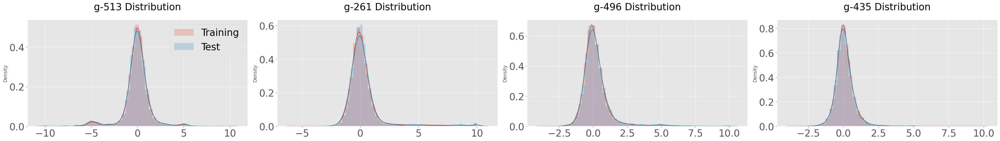

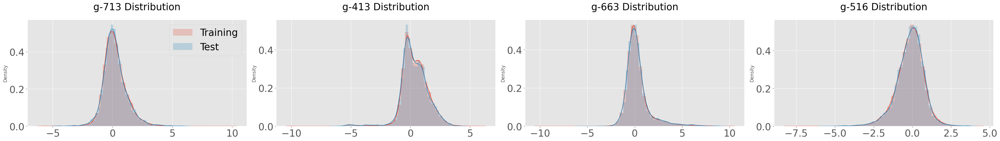

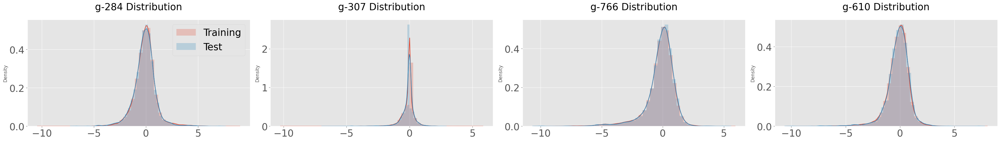

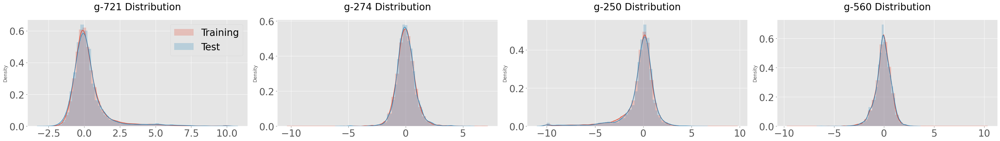

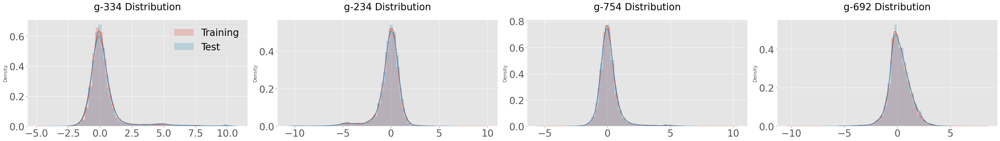

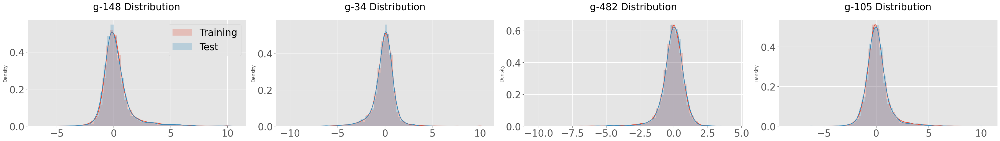

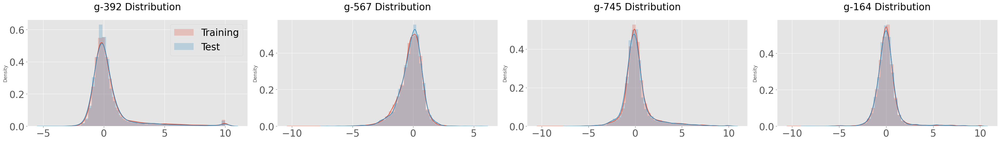

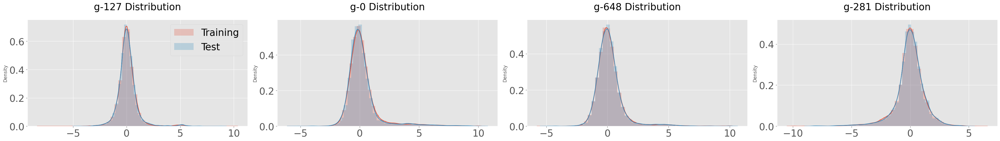

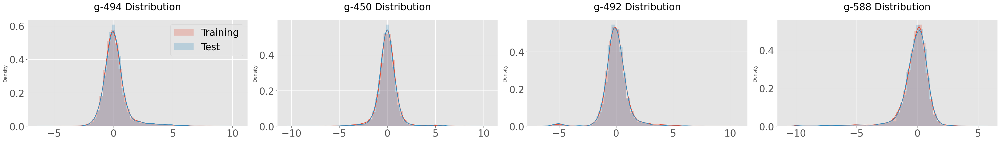

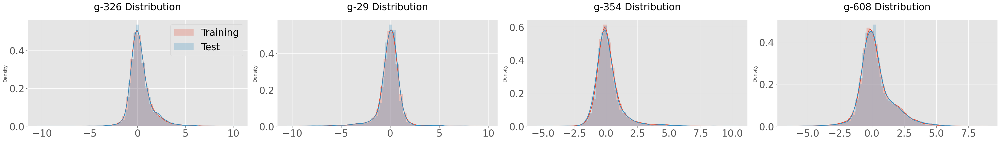

In [23]:
# randomly select 100 gene expression features
def distplot_gfeature(feature_group):
        
    fig, axes = plt.subplots(ncols=4, figsize=(36, 5), dpi=100, constrained_layout=True)
    title_size = 25
    label_size = 25

    for i, feature in enumerate(feature_group):
        sns.distplot(train[feature], label='Training', ax=axes[i], hist_kws={'alpha': 0.25})
        sns.distplot(test[feature], label='Test', ax=axes[i], hist_kws={'alpha': 0.25})
        axes[i].set_xlabel('')
        axes[i].tick_params(axis='x', labelsize=label_size)
        axes[i].tick_params(axis='y', labelsize=label_size)
        
        if i % 5 == 0:
            axes[i].legend(prop={'size': 25})
            
        axes[i].set_title(f'{feature} Distribution', size=title_size, pad=title_size)
    
    plt.show()

shuffled_g_features = np.copy(g_list)
np.random.shuffle(shuffled_g_features)
for feature_group in np.array_split(shuffled_g_features, len(shuffled_g_features) // 4)[:10]:
    distplot_gfeature(feature_group)

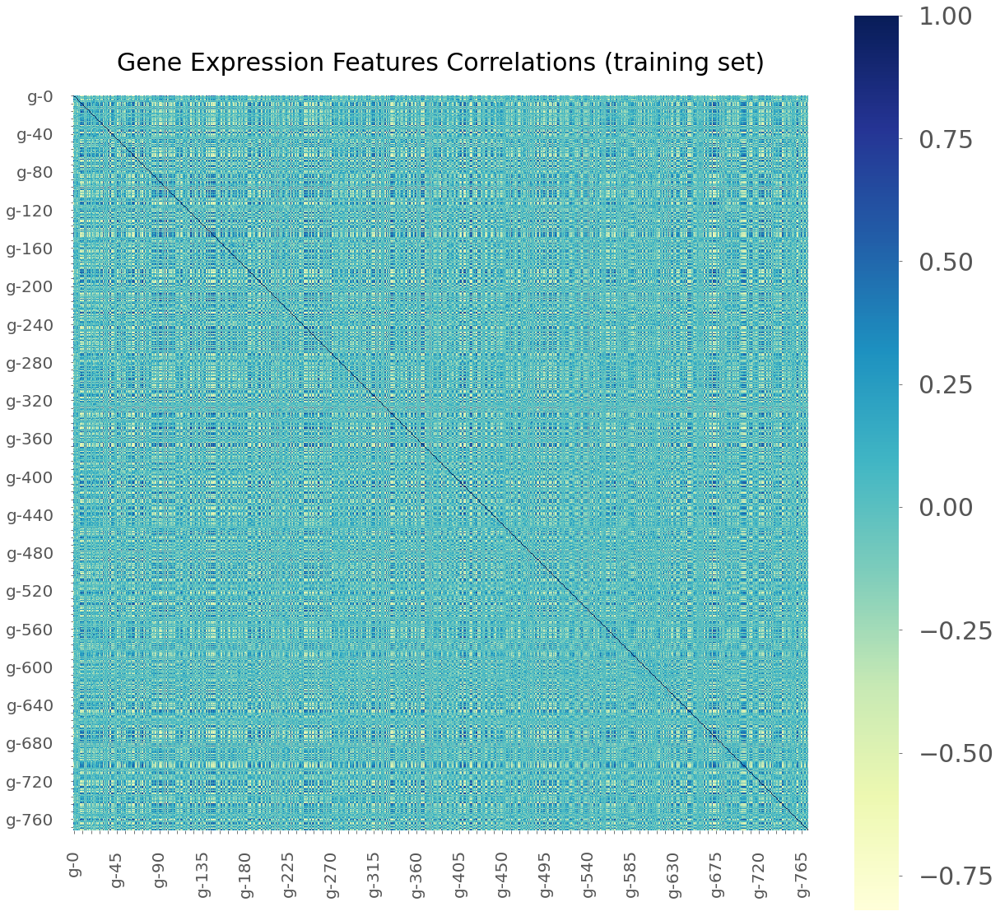

In [24]:
fig = plt.figure(figsize=(20, 20))

ax = sns.heatmap(train[g_list].corr(),
                 annot=False,
                 square=True,
                 cmap="YlGnBu")

ax.tick_params(axis='x', labelsize=20, rotation=90, pad=20)
ax.tick_params(axis='y', labelsize=20, rotation=0, pad=20)

for idx, label in enumerate(ax.get_xticklabels()):
    if idx % 5 == 0:
        label.set_visible(True)
    else:
        label.set_visible(False)
        
for idx, label in enumerate(ax.get_yticklabels()):
    if idx % 5 == 0:
        label.set_visible(True)
    else:
        label.set_visible(False)
        
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=30, pad=20)

plt.title('Gene Expression Features Correlations (training set)', size=30, pad=30)
plt.show()

### 2.4 Target Analysis


Target features are categorized into two groups; scored and non-scored target features, and features in both of those groups are binary. The competition score is based on the scored target features but non-scored group can still be used for model evaluation, data analysis and feature engineering.

In [25]:
train_target_scored = pd.read_csv(data_dir+"train_targets_scored.csv")

print('Number of rows: ', train_target_scored.shape[0])
print('Number of cols: ', train_target_scored.shape[1])

train_target_scored.head()

Number of rows:  23814
Number of cols:  207


,sig_id,5-alpha_reductase_inhibitor,11-beta-hsd1_inhibitor,acat_inhibitor,acetylcholine_receptor_agonist,acetylcholine_receptor_antagonist,acetylcholinesterase_inhibitor,adenosine_receptor_agonist,adenosine_receptor_antagonist,adenylyl_cyclase_activator,adrenergic_receptor_agonist,adrenergic_receptor_antagonist,akt_inhibitor,aldehyde_dehydrogenase_inhibitor,alk_inhibitor,ampk_activator,analgesic,androgen_receptor_agonist,androgen_receptor_antagonist,anesthetic_-_local,angiogenesis_inhibitor,angiotensin_receptor_antagonist,anti-inflammatory,antiarrhythmic,antibiotic,anticonvulsant,antifungal,antihistamine,antimalarial,antioxidant,antiprotozoal,antiviral,apoptosis_stimulant,aromatase_inhibitor,atm_kinase_inhibitor,atp-sensitive_potassium_channel_antagonist,atp_synthase_inhibitor,atpase_inhibitor,atr_kinase_inhibitor,aurora_kinase_inhibitor,autotaxin_inhibitor,bacterial_30s_ribosomal_subunit_inhibitor,bacterial_50s_ribosomal_subunit_inhibitor,bacterial_antifolate,bacterial_cell_wall_synthesis_inhibitor,bacterial_dna_gyrase_inhibitor,bacterial_dna_inhibitor,bacterial_membrane_integrity_inhibitor,bcl_inhibitor,bcr-abl_inhibitor,benzodiazepine_receptor_agonist,beta_amyloid_inhibitor,bromodomain_inhibitor,btk_inhibitor,calcineurin_inhibitor,calcium_channel_blocker,cannabinoid_receptor_agonist,cannabinoid_receptor_antagonist,carbonic_anhydrase_inhibitor,casein_kinase_inhibitor,caspase_activator,catechol_o_methyltransferase_inhibitor,cc_chemokine_receptor_antagonist,cck_receptor_antagonist,cdk_inhibitor,chelating_agent,chk_inhibitor,chloride_channel_blocker,cholesterol_inhibitor,cholinergic_receptor_antagonist,coagulation_factor_inhibitor,corticosteroid_agonist,cyclooxygenase_inhibitor,cytochrome_p450_inhibitor,dihydrofolate_reductase_inhibitor,dipeptidyl_peptidase_inhibitor,diuretic,dna_alkylating_agent,dna_inhibitor,dopamine_receptor_agonist,dopamine_receptor_antagonist,egfr_inhibitor,elastase_inhibitor,erbb2_inhibitor,estrogen_receptor_agonist,estrogen_receptor_antagonist,faah_inhibitor,farnesyltransferase_inhibitor,fatty_acid_receptor_agonist,fgfr_inhibitor,flt3_inhibitor,focal_adhesion_kinase_inhibitor,free_radical_scavenger,fungal_squalene_epoxidase_inhibitor,gaba_receptor_agonist,gaba_receptor_antagonist,gamma_secretase_inhibitor,glucocorticoid_receptor_agonist,glutamate_inhibitor,glutamate_receptor_agonist,glutamate_receptor_antagonist,gonadotropin_receptor_agonist,gsk_inhibitor,hcv_inhibitor,hdac_inhibitor,histamine_receptor_agonist,histamine_receptor_antagonist,histone_lysine_demethylase_inhibitor,histone_lysine_methyltransferase_inhibitor,hiv_inhibitor,hmgcr_inhibitor,hsp_inhibitor,igf-1_inhibitor,ikk_inhibitor,imidazoline_receptor_agonist,immunosuppressant,insulin_secretagogue,insulin_sensitizer,integrin_inhibitor,jak_inhibitor,kit_inhibitor,laxative,leukotriene_inhibitor,leukotriene_receptor_antagonist,lipase_inhibitor,lipoxygenase_inhibitor,lxr_agonist,mdm_inhibitor,mek_inhibitor,membrane_integrity_inhibitor,mineralocorticoid_receptor_antagonist,monoacylglycerol_lipase_inhibitor,monoamine_oxidase_inhibitor,monopolar_spindle_1_kinase_inhibitor,mtor_inhibitor,mucolytic_agent,neuropeptide_receptor_antagonist,nfkb_inhibitor,nicotinic_receptor_agonist,nitric_oxide_donor,nitric_oxide_production_inhibitor,nitric_oxide_synthase_inhibitor,norepinephrine_reuptake_inhibitor,nrf2_activator,opioid_receptor_agonist,opioid_receptor_antagonist,orexin_receptor_antagonist,p38_mapk_inhibitor,p-glycoprotein_inhibitor,parp_inhibitor,pdgfr_inhibitor,pdk_inhibitor,phosphodiesterase_inhibitor,phospholipase_inhibitor,pi3k_inhibitor,pkc_inhibitor,potassium_channel_activator,potassium_channel_antagonist,ppar_receptor_agonist,ppar_receptor_antagonist,progesterone_receptor_agonist,progesterone_receptor_antagonist,prostaglandin_inhibitor,prostanoid_receptor_antagonist,proteasome_inhibitor,protein_kinase_inhibitor,protein_phosphatase_inhibitor,protein_synthesis_inhibitor,protein_tyrosine_kinase_inhibitor,radiopaque_medium,raf_inhibitor,ras_gtpase_inhib

In [26]:
train_target_nonscored = pd.read_csv(data_dir+"train_targets_nonscored.csv")

print('Number of rows: ', train_target_nonscored.shape[0])
print('Number of cols: ', train_target_nonscored.shape[1])

train_target_nonscored.head()

Number of rows:  23814
Number of cols:  403


,sig_id,abc_transporter_expression_enhancer,abl_inhibitor,ace_inhibitor,acetylcholine_release_enhancer,adenosine_deaminase_inhibitor,adenosine_kinase_inhibitor,adenylyl_cyclase_inhibitor,age_inhibitor,alcohol_dehydrogenase_inhibitor,aldehyde_dehydrogenase_activator,aldose_reductase_inhibitor,alpha_mannosidase_inhibitor,ampk_inhibitor,androgen_biosynthesis_inhibitor,angiotensin_receptor_agonist,antacid,anthelmintic,antihypertensive,antimetabolite,antipruritic,antirheumatic_drug,antiseptic,antispasmodic,antithyroid_agent,antitussive,anxiolytic,ap_inhibitor,apolipoprotein_expression_enhancer,apoptosis_inhibitor,arf_inhibitor,aryl_hydrocarbon_receptor_agonist,aryl_hydrocarbon_receptor_antagonist,aspartic_protease_inhibitor,atherogenesis_inhibitor,atherosclerosis_formation_inhibitor,atp-sensitive_potassium_channel_agonist,atp-sensitive_potassium_channel_inhibitor,atp_channel_activator,atp_channel_blocker,atp_citrase_lyase_inhibitor,autophagy_inducer,axl_kinase_inhibitor,bacterial_atpase_inhibitor,bacterial_permeability_inducer,bacterial_protein_synthesis_inhibitor,benzodiazepine_receptor_antagonist,beta_catenin_inhibitor,beta_lactamase_inhibitor,beta_secretase_inhibitor,big1_inhibitor,bile_acid,biliverdin_reductase_a_activator,bone_resorption_inhibitor,botulin_neurotoxin_inhibitor,bradykinin_receptor_antagonist,breast_cancer_resistance_protein_inhibitor,bronchodilator,calcitonin_antagonist,calcium_channel_activator,calmodulin_inhibitor,calpain_inhibitor,camp_stimulant,capillary_stabilizing_agent,car_agonist,car_antagonist,carboxylesterase_inhibitor,carcinogen,cardiac_glycoside,carnitine_palmitoyltransferase_inhibitor,caspase_inhibitor,cathepsin_inhibitor,cc_chemokine_receptor_agonist,cdc_inhibitor,cdk_expression_enhancer,cell_cycle_inhibitor,cell_proliferation_inhibitor,ceramidase_inhibitor,cftr_channel_agonist,cftr_channel_antagonist,chitin_inhibitor,chloride_channel_activator,choleretic_agent,cholinergic_receptor_agonist,cholinesterase_inhibitor,clk_inhibitor,coenzyme_a_precursor,collagenase_inhibitor,collapsin_response_mediator_protein_stimulant,coloring_agent,complement_antagonist,complement_inhibitor,contraceptive_agent,contrast_agent,corticosteroid_antagonist,cyclin_d_inhibitor,cysteine_peptidase_inhibitor,cytidine_deaminase_inhibitor,cytokine_production_inhibitor,dehydrogenase_inhibitor,deubiquitinase_inhibitor,diacylglycerol_kinase_inhibitor,diacylglycerol_o_acyltransferase_inhibitor,differentiation_inducer,dihydroorotate_dehydrogenase_inhibitor,dihydropteroate_synthase_inhibitor,dihydropyrimidine_dehydrogenase_inhibitor,dna_dependent_protein_kinase_inhibitor,dna_methyltransferase_inhibitor,dna_polymerase_inhibitor,dna_repair_enzyme_inhibitor,dna_synthesis_inhibitor,dopamine_release_enhancer,dot1l_inhibitor,dynamin_inhibitor,dyrk_inhibitor,dystrophin_stimulant,endothelin_receptor_antagonist,enkephalinase_inhibitor,ephrin_inhibitor,epoxide_hydolase_inhibitor,etv1_inhibitor,eukaryotic_translation_initiation_factor_inhibitor,exportin_antagonist,fabi_inhibitor,farnesyl_pyrophosphate_synthase_inhibitor,fatty_acid_receptor_antagonist,fatty_acid_synthase_inhibitor,folate_receptor_ligand,free_fatty_acid_receptor_agonist,"fungal_1,3-beta-d-glucan_synthase_inhibitor",fungal_ergosterol_inhibitor,fungal_lanosterol_demethylase_inhibitor,fxr_agonist,fxr_antagonist,g_protein-coupled_receptor_agonist,g_protein-coupled_receptor_antagonist,g_protein_signaling_inhibitor,gaba_gated_chloride_channel_blocker,gaba_receptor_modulator,gaba_uptake_inhibitor,gap_junction_modulator,gastrin_inhibitor,gat_inhibitor,glcnac_phosphotransferase_inhibitor,gli_antagonist,glp_receptor_agonist,glucagon_receptor_antagonist,glucocorticoid_receptor_antagonist,glucokinase_activator,glucokinase_inhibitor,gluconeogenesis_inhibitor,glucose_dependent_insulinotropic_receptor_agonist,glucosidase_inhibitor,glutamate_receptor_modulator,glutathione_peroxidase_agonist,glutathione_reductase_(nadph)_activators,glutathione_transferase_inhibitor,glycine_receptor_antagonist,glyci

In [27]:
test_target_scored = pd.read_csv(data_dir+"sample_submission.csv")

print('Number of rows: ', test_target_scored.shape[0])
print('Number of cols: ', test_target_scored.shape[1])

test_target_scored.head()

Number of rows:  3982
Number of cols:  207


,sig_id,5-alpha_reductase_inhibitor,11-beta-hsd1_inhibitor,acat_inhibitor,acetylcholine_receptor_agonist,acetylcholine_receptor_antagonist,acetylcholinesterase_inhibitor,adenosine_receptor_agonist,adenosine_receptor_antagonist,adenylyl_cyclase_activator,adrenergic_receptor_agonist,adrenergic_receptor_antagonist,akt_inhibitor,aldehyde_dehydrogenase_inhibitor,alk_inhibitor,ampk_activator,analgesic,androgen_receptor_agonist,androgen_receptor_antagonist,anesthetic_-_local,angiogenesis_inhibitor,angiotensin_receptor_antagonist,anti-inflammatory,antiarrhythmic,antibiotic,anticonvulsant,antifungal,antihistamine,antimalarial,antioxidant,antiprotozoal,antiviral,apoptosis_stimulant,aromatase_inhibitor,atm_kinase_inhibitor,atp-sensitive_potassium_channel_antagonist,atp_synthase_inhibitor,atpase_inhibitor,atr_kinase_inhibitor,aurora_kinase_inhibitor,autotaxin_inhibitor,bacterial_30s_ribosomal_subunit_inhibitor,bacterial_50s_ribosomal_subunit_inhibitor,bacterial_antifolate,bacterial_cell_wall_synthesis_inhibitor,bacterial_dna_gyrase_inhibitor,bacterial_dna_inhibitor,bacterial_membrane_integrity_inhibitor,bcl_inhibitor,bcr-abl_inhibitor,benzodiazepine_receptor_agonist,beta_amyloid_inhibitor,bromodomain_inhibitor,btk_inhibitor,calcineurin_inhibitor,calcium_channel_blocker,cannabinoid_receptor_agonist,cannabinoid_receptor_antagonist,carbonic_anhydrase_inhibitor,casein_kinase_inhibitor,caspase_activator,catechol_o_methyltransferase_inhibitor,cc_chemokine_receptor_antagonist,cck_receptor_antagonist,cdk_inhibitor,chelating_agent,chk_inhibitor,chloride_channel_blocker,cholesterol_inhibitor,cholinergic_receptor_antagonist,coagulation_factor_inhibitor,corticosteroid_agonist,cyclooxygenase_inhibitor,cytochrome_p450_inhibitor,dihydrofolate_reductase_inhibitor,dipeptidyl_peptidase_inhibitor,diuretic,dna_alkylating_agent,dna_inhibitor,dopamine_receptor_agonist,dopamine_receptor_antagonist,egfr_inhibitor,elastase_inhibitor,erbb2_inhibitor,estrogen_receptor_agonist,estrogen_receptor_antagonist,faah_inhibitor,farnesyltransferase_inhibitor,fatty_acid_receptor_agonist,fgfr_inhibitor,flt3_inhibitor,focal_adhesion_kinase_inhibitor,free_radical_scavenger,fungal_squalene_epoxidase_inhibitor,gaba_receptor_agonist,gaba_receptor_antagonist,gamma_secretase_inhibitor,glucocorticoid_receptor_agonist,glutamate_inhibitor,glutamate_receptor_agonist,glutamate_receptor_antagonist,gonadotropin_receptor_agonist,gsk_inhibitor,hcv_inhibitor,hdac_inhibitor,histamine_receptor_agonist,histamine_receptor_antagonist,histone_lysine_demethylase_inhibitor,histone_lysine_methyltransferase_inhibitor,hiv_inhibitor,hmgcr_inhibitor,hsp_inhibitor,igf-1_inhibitor,ikk_inhibitor,imidazoline_receptor_agonist,immunosuppressant,insulin_secretagogue,insulin_sensitizer,integrin_inhibitor,jak_inhibitor,kit_inhibitor,laxative,leukotriene_inhibitor,leukotriene_receptor_antagonist,lipase_inhibitor,lipoxygenase_inhibitor,lxr_agonist,mdm_inhibitor,mek_inhibitor,membrane_integrity_inhibitor,mineralocorticoid_receptor_antagonist,monoacylglycerol_lipase_inhibitor,monoamine_oxidase_inhibitor,monopolar_spindle_1_kinase_inhibitor,mtor_inhibitor,mucolytic_agent,neuropeptide_receptor_antagonist,nfkb_inhibitor,nicotinic_receptor_agonist,nitric_oxide_donor,nitric_oxide_production_inhibitor,nitric_oxide_synthase_inhibitor,norepinephrine_reuptake_inhibitor,nrf2_activator,opioid_receptor_agonist,opioid_receptor_antagonist,orexin_receptor_antagonist,p38_mapk_inhibitor,p-glycoprotein_inhibitor,parp_inhibitor,pdgfr_inhibitor,pdk_inhibitor,phosphodiesterase_inhibitor,phospholipase_inhibitor,pi3k_inhibitor,pkc_inhibitor,potassium_channel_activator,potassium_channel_antagonist,ppar_receptor_agonist,ppar_receptor_antagonist,progesterone_receptor_agonist,progesterone_receptor_antagonist,prostaglandin_inhibitor,prostanoid_receptor_antagonist,proteasome_inhibitor,protein_kinase_inhibitor,protein_phosphatase_inhibitor,protein_synthesis_inhibitor,protein_tyrosine_kinase_inhibitor,radiopaque_medium,raf_inhibitor,ras_gtpase_inhib

In [28]:
# reload, merge train/test features and targets
df_train = pd.read_csv('../input/lish-moa/train_features.csv')
df_test = pd.read_csv('../input/lish-moa/test_features.csv')

df_train_targets_scored = pd.read_csv('../input/lish-moa/train_targets_scored.csv')
df_train_targets_nonscored = pd.read_csv('../input/lish-moa/train_targets_nonscored.csv')
df_test_targets = pd.read_csv('../input/lish-moa/sample_submission.csv')

target_features_scored = list(df_train_targets_scored.columns[1:])
target_features_nonscored = list(df_train_targets_nonscored.columns[1:])
df_train_targets_scored[target_features_scored] = df_train_targets_scored[target_features_scored].astype(np.uint8)
df_train_targets_nonscored[target_features_nonscored] = df_train_targets_nonscored[target_features_nonscored].astype(np.uint8)
df_test_targets[target_features_scored] = df_test_targets[target_features_scored].astype(np.float32)

df_train = df_train.merge(df_train_targets_scored, on='sig_id', how='left')
df_train = df_train.merge(df_train_targets_nonscored, on='sig_id', how='left')
df_test = df_test.merge(df_test_targets, on='sig_id', how='left')

del df_train_targets_scored, df_train_targets_nonscored, df_test_targets

print(f'Training Set Shape = {df_train.shape}')
print(f'Training Set Memory Usage = {df_train.memory_usage().sum() / 1024 ** 2:.2f} MB')
print(f'Test Set Shape = {df_test.shape}')
print(f'Test Set Memory Usage = {df_test.memory_usage().sum() / 1024 ** 2:.2f} MB')

Training Set Shape = (23814, 1484)
Training Set Memory Usage = 173.15 MB
Test Set Shape = (3982, 1082)
Test Set Memory Usage = 29.77 MB


It is a multi-label classification problem but one sample can be classified to multiple targets or none of the targets as well. Most of the time, samples are classified to 0 or 1 target, but a small part of the training set samples are classified to 2, 3, 4, 5 and 7 different targets at the same time. Classified targets distributions are not very similar for scored targets and non-scored targets since there is a huge discrepancy of 0 and 1 classified targets.

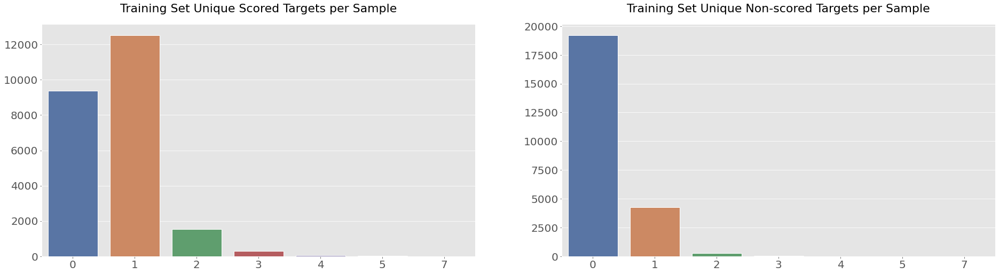

In [29]:
scored_targets_classified = df_train[target_features_scored].sum(axis=1)
nonscored_targets_classified = df_train[target_features_nonscored].sum(axis=1)

fig, axes = plt.subplots(figsize=(32, 8), ncols=2)

sns.set_theme()
sns.countplot(scored_targets_classified, ax=axes[0])
sns.countplot(nonscored_targets_classified, ax=axes[1])

for i in range(2):
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=20)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    
axes[0].set_title(f'Training Set Unique Scored Targets per Sample', size=22, pad=22)
axes[1].set_title(f'Training Set Unique Non-scored Targets per Sample', size=22, pad=22)

plt.show()

In [30]:
df_train[target_features_scored].describe()

,5-alpha_reductase_inhibitor,11-beta-hsd1_inhibitor,acat_inhibitor,acetylcholine_receptor_agonist,acetylcholine_receptor_antagonist,acetylcholinesterase_inhibitor,adenosine_receptor_agonist,adenosine_receptor_antagonist,adenylyl_cyclase_activator,adrenergic_receptor_agonist,adrenergic_receptor_antagonist,akt_inhibitor,aldehyde_dehydrogenase_inhibitor,alk_inhibitor,ampk_activator,analgesic,androgen_receptor_agonist,androgen_receptor_antagonist,anesthetic_-_local,angiogenesis_inhibitor,angiotensin_receptor_antagonist,anti-inflammatory,antiarrhythmic,antibiotic,anticonvulsant,antifungal,antihistamine,antimalarial,antioxidant,antiprotozoal,antiviral,apoptosis_stimulant,aromatase_inhibitor,atm_kinase_inhibitor,atp-sensitive_potassium_channel_antagonist,atp_synthase_inhibitor,atpase_inhibitor,atr_kinase_inhibitor,aurora_kinase_inhibitor,autotaxin_inhibitor,bacterial_30s_ribosomal_subunit_inhibitor,bacterial_50s_ribosomal_subunit_inhibitor,bacterial_antifolate,bacterial_cell_wall_synthesis_inhibitor,bacterial_dna_gyrase_inhibitor,bacterial_dna_inhibitor,bacterial_membrane_integrity_inhibitor,bcl_inhibitor,bcr-abl_inhibitor,benzodiazepine_receptor_agonist,beta_amyloid_inhibitor,bromodomain_inhibitor,btk_inhibitor,calcineurin_inhibitor,calcium_channel_blocker,cannabinoid_receptor_agonist,cannabinoid_receptor_antagonist,carbonic_anhydrase_inhibitor,casein_kinase_inhibitor,caspase_activator,catechol_o_methyltransferase_inhibitor,cc_chemokine_receptor_antagonist,cck_receptor_antagonist,cdk_inhibitor,chelating_agent,chk_inhibitor,chloride_channel_blocker,cholesterol_inhibitor,cholinergic_receptor_antagonist,coagulation_factor_inhibitor,corticosteroid_agonist,cyclooxygenase_inhibitor,cytochrome_p450_inhibitor,dihydrofolate_reductase_inhibitor,dipeptidyl_peptidase_inhibitor,diuretic,dna_alkylating_agent,dna_inhibitor,dopamine_receptor_agonist,dopamine_receptor_antagonist,egfr_inhibitor,elastase_inhibitor,erbb2_inhibitor,estrogen_receptor_agonist,estrogen_receptor_antagonist,faah_inhibitor,farnesyltransferase_inhibitor,fatty_acid_receptor_agonist,fgfr_inhibitor,flt3_inhibitor,focal_adhesion_kinase_inhibitor,free_radical_scavenger,fungal_squalene_epoxidase_inhibitor,gaba_receptor_agonist,gaba_receptor_antagonist,gamma_secretase_inhibitor,glucocorticoid_receptor_agonist,glutamate_inhibitor,glutamate_receptor_agonist,glutamate_receptor_antagonist,gonadotropin_receptor_agonist,gsk_inhibitor,hcv_inhibitor,hdac_inhibitor,histamine_receptor_agonist,histamine_receptor_antagonist,histone_lysine_demethylase_inhibitor,histone_lysine_methyltransferase_inhibitor,hiv_inhibitor,hmgcr_inhibitor,hsp_inhibitor,igf-1_inhibitor,ikk_inhibitor,imidazoline_receptor_agonist,immunosuppressant,insulin_secretagogue,insulin_sensitizer,integrin_inhibitor,jak_inhibitor,kit_inhibitor,laxative,leukotriene_inhibitor,leukotriene_receptor_antagonist,lipase_inhibitor,lipoxygenase_inhibitor,lxr_agonist,mdm_inhibitor,mek_inhibitor,membrane_integrity_inhibitor,mineralocorticoid_receptor_antagonist,monoacylglycerol_lipase_inhibitor,monoamine_oxidase_inhibitor,monopolar_spindle_1_kinase_inhibitor,mtor_inhibitor,mucolytic_agent,neuropeptide_receptor_antagonist,nfkb_inhibitor,nicotinic_receptor_agonist,nitric_oxide_donor,nitric_oxide_production_inhibitor,nitric_oxide_synthase_inhibitor,norepinephrine_reuptake_inhibitor,nrf2_activator,opioid_receptor_agonist,opioid_receptor_antagonist,orexin_receptor_antagonist,p38_mapk_inhibitor,p-glycoprotein_inhibitor,parp_inhibitor,pdgfr_inhibitor,pdk_inhibitor,phosphodiesterase_inhibitor,phospholipase_inhibitor,pi3k_inhibitor,pkc_inhibitor,potassium_channel_activator,potassium_channel_antagonist,ppar_receptor_agonist,ppar_receptor_antagonist,progesterone_receptor_agonist,progesterone_receptor_antagonist,prostaglandin_inhibitor,prostanoid_receptor_antagonist,proteasome_inhibitor,protein_kinase_inhibitor,protein_phosphatase_inhibitor,protein_synthesis_inhibitor,protein_tyrosine_kinase_inhibitor,radiopaque_medium,raf_inhibitor,ras_gtpase_inhibitor,re

In [31]:
df_train[target_features_nonscored].describe()

,abc_transporter_expression_enhancer,abl_inhibitor,ace_inhibitor,acetylcholine_release_enhancer,adenosine_deaminase_inhibitor,adenosine_kinase_inhibitor,adenylyl_cyclase_inhibitor,age_inhibitor,alcohol_dehydrogenase_inhibitor,aldehyde_dehydrogenase_activator,aldose_reductase_inhibitor,alpha_mannosidase_inhibitor,ampk_inhibitor,androgen_biosynthesis_inhibitor,angiotensin_receptor_agonist,antacid,anthelmintic,antihypertensive,antimetabolite,antipruritic,antirheumatic_drug,antiseptic,antispasmodic,antithyroid_agent,antitussive,anxiolytic,ap_inhibitor,apolipoprotein_expression_enhancer,apoptosis_inhibitor,arf_inhibitor,aryl_hydrocarbon_receptor_agonist,aryl_hydrocarbon_receptor_antagonist,aspartic_protease_inhibitor,atherogenesis_inhibitor,atherosclerosis_formation_inhibitor,atp-sensitive_potassium_channel_agonist,atp-sensitive_potassium_channel_inhibitor,atp_channel_activator,atp_channel_blocker,atp_citrase_lyase_inhibitor,autophagy_inducer,axl_kinase_inhibitor,bacterial_atpase_inhibitor,bacterial_permeability_inducer,bacterial_protein_synthesis_inhibitor,benzodiazepine_receptor_antagonist,beta_catenin_inhibitor,beta_lactamase_inhibitor,beta_secretase_inhibitor,big1_inhibitor,bile_acid,biliverdin_reductase_a_activator,bone_resorption_inhibitor,botulin_neurotoxin_inhibitor,bradykinin_receptor_antagonist,breast_cancer_resistance_protein_inhibitor,bronchodilator,calcitonin_antagonist,calcium_channel_activator,calmodulin_inhibitor,calpain_inhibitor,camp_stimulant,capillary_stabilizing_agent,car_agonist,car_antagonist,carboxylesterase_inhibitor,carcinogen,cardiac_glycoside,carnitine_palmitoyltransferase_inhibitor,caspase_inhibitor,cathepsin_inhibitor,cc_chemokine_receptor_agonist,cdc_inhibitor,cdk_expression_enhancer,cell_cycle_inhibitor,cell_proliferation_inhibitor,ceramidase_inhibitor,cftr_channel_agonist,cftr_channel_antagonist,chitin_inhibitor,chloride_channel_activator,choleretic_agent,cholinergic_receptor_agonist,cholinesterase_inhibitor,clk_inhibitor,coenzyme_a_precursor,collagenase_inhibitor,collapsin_response_mediator_protein_stimulant,coloring_agent,complement_antagonist,complement_inhibitor,contraceptive_agent,contrast_agent,corticosteroid_antagonist,cyclin_d_inhibitor,cysteine_peptidase_inhibitor,cytidine_deaminase_inhibitor,cytokine_production_inhibitor,dehydrogenase_inhibitor,deubiquitinase_inhibitor,diacylglycerol_kinase_inhibitor,diacylglycerol_o_acyltransferase_inhibitor,differentiation_inducer,dihydroorotate_dehydrogenase_inhibitor,dihydropteroate_synthase_inhibitor,dihydropyrimidine_dehydrogenase_inhibitor,dna_dependent_protein_kinase_inhibitor,dna_methyltransferase_inhibitor,dna_polymerase_inhibitor,dna_repair_enzyme_inhibitor,dna_synthesis_inhibitor,dopamine_release_enhancer,dot1l_inhibitor,dynamin_inhibitor,dyrk_inhibitor,dystrophin_stimulant,endothelin_receptor_antagonist,enkephalinase_inhibitor,ephrin_inhibitor,epoxide_hydolase_inhibitor,etv1_inhibitor,eukaryotic_translation_initiation_factor_inhibitor,exportin_antagonist,fabi_inhibitor,farnesyl_pyrophosphate_synthase_inhibitor,fatty_acid_receptor_antagonist,fatty_acid_synthase_inhibitor,folate_receptor_ligand,free_fatty_acid_receptor_agonist,"fungal_1,3-beta-d-glucan_synthase_inhibitor",fungal_ergosterol_inhibitor,fungal_lanosterol_demethylase_inhibitor,fxr_agonist,fxr_antagonist,g_protein-coupled_receptor_agonist,g_protein-coupled_receptor_antagonist,g_protein_signaling_inhibitor,gaba_gated_chloride_channel_blocker,gaba_receptor_modulator,gaba_uptake_inhibitor,gap_junction_modulator,gastrin_inhibitor,gat_inhibitor,glcnac_phosphotransferase_inhibitor,gli_antagonist,glp_receptor_agonist,glucagon_receptor_antagonist,glucocorticoid_receptor_antagonist,glucokinase_activator,glucokinase_inhibitor,gluconeogenesis_inhibitor,glucose_dependent_insulinotropic_receptor_agonist,glucosidase_inhibitor,glutamate_receptor_modulator,glutathione_peroxidase_agonist,glutathione_reductase_(nadph)_activators,glutathione_transferase_inhibitor,glycine_receptor_antagonist,glycine_tran

In [32]:
df_test[target_features_scored].describe()

,5-alpha_reductase_inhibitor,11-beta-hsd1_inhibitor,acat_inhibitor,acetylcholine_receptor_agonist,acetylcholine_receptor_antagonist,acetylcholinesterase_inhibitor,adenosine_receptor_agonist,adenosine_receptor_antagonist,adenylyl_cyclase_activator,adrenergic_receptor_agonist,adrenergic_receptor_antagonist,akt_inhibitor,aldehyde_dehydrogenase_inhibitor,alk_inhibitor,ampk_activator,analgesic,androgen_receptor_agonist,androgen_receptor_antagonist,anesthetic_-_local,angiogenesis_inhibitor,angiotensin_receptor_antagonist,anti-inflammatory,antiarrhythmic,antibiotic,anticonvulsant,antifungal,antihistamine,antimalarial,antioxidant,antiprotozoal,antiviral,apoptosis_stimulant,aromatase_inhibitor,atm_kinase_inhibitor,atp-sensitive_potassium_channel_antagonist,atp_synthase_inhibitor,atpase_inhibitor,atr_kinase_inhibitor,aurora_kinase_inhibitor,autotaxin_inhibitor,bacterial_30s_ribosomal_subunit_inhibitor,bacterial_50s_ribosomal_subunit_inhibitor,bacterial_antifolate,bacterial_cell_wall_synthesis_inhibitor,bacterial_dna_gyrase_inhibitor,bacterial_dna_inhibitor,bacterial_membrane_integrity_inhibitor,bcl_inhibitor,bcr-abl_inhibitor,benzodiazepine_receptor_agonist,beta_amyloid_inhibitor,bromodomain_inhibitor,btk_inhibitor,calcineurin_inhibitor,calcium_channel_blocker,cannabinoid_receptor_agonist,cannabinoid_receptor_antagonist,carbonic_anhydrase_inhibitor,casein_kinase_inhibitor,caspase_activator,catechol_o_methyltransferase_inhibitor,cc_chemokine_receptor_antagonist,cck_receptor_antagonist,cdk_inhibitor,chelating_agent,chk_inhibitor,chloride_channel_blocker,cholesterol_inhibitor,cholinergic_receptor_antagonist,coagulation_factor_inhibitor,corticosteroid_agonist,cyclooxygenase_inhibitor,cytochrome_p450_inhibitor,dihydrofolate_reductase_inhibitor,dipeptidyl_peptidase_inhibitor,diuretic,dna_alkylating_agent,dna_inhibitor,dopamine_receptor_agonist,dopamine_receptor_antagonist,egfr_inhibitor,elastase_inhibitor,erbb2_inhibitor,estrogen_receptor_agonist,estrogen_receptor_antagonist,faah_inhibitor,farnesyltransferase_inhibitor,fatty_acid_receptor_agonist,fgfr_inhibitor,flt3_inhibitor,focal_adhesion_kinase_inhibitor,free_radical_scavenger,fungal_squalene_epoxidase_inhibitor,gaba_receptor_agonist,gaba_receptor_antagonist,gamma_secretase_inhibitor,glucocorticoid_receptor_agonist,glutamate_inhibitor,glutamate_receptor_agonist,glutamate_receptor_antagonist,gonadotropin_receptor_agonist,gsk_inhibitor,hcv_inhibitor,hdac_inhibitor,histamine_receptor_agonist,histamine_receptor_antagonist,histone_lysine_demethylase_inhibitor,histone_lysine_methyltransferase_inhibitor,hiv_inhibitor,hmgcr_inhibitor,hsp_inhibitor,igf-1_inhibitor,ikk_inhibitor,imidazoline_receptor_agonist,immunosuppressant,insulin_secretagogue,insulin_sensitizer,integrin_inhibitor,jak_inhibitor,kit_inhibitor,laxative,leukotriene_inhibitor,leukotriene_receptor_antagonist,lipase_inhibitor,lipoxygenase_inhibitor,lxr_agonist,mdm_inhibitor,mek_inhibitor,membrane_integrity_inhibitor,mineralocorticoid_receptor_antagonist,monoacylglycerol_lipase_inhibitor,monoamine_oxidase_inhibitor,monopolar_spindle_1_kinase_inhibitor,mtor_inhibitor,mucolytic_agent,neuropeptide_receptor_antagonist,nfkb_inhibitor,nicotinic_receptor_agonist,nitric_oxide_donor,nitric_oxide_production_inhibitor,nitric_oxide_synthase_inhibitor,norepinephrine_reuptake_inhibitor,nrf2_activator,opioid_receptor_agonist,opioid_receptor_antagonist,orexin_receptor_antagonist,p38_mapk_inhibitor,p-glycoprotein_inhibitor,parp_inhibitor,pdgfr_inhibitor,pdk_inhibitor,phosphodiesterase_inhibitor,phospholipase_inhibitor,pi3k_inhibitor,pkc_inhibitor,potassium_channel_activator,potassium_channel_antagonist,ppar_receptor_agonist,ppar_receptor_antagonist,progesterone_receptor_agonist,progesterone_receptor_antagonist,prostaglandin_inhibitor,prostanoid_receptor_antagonist,proteasome_inhibitor,protein_kinase_inhibitor,protein_phosphatase_inhibitor,protein_synthesis_inhibitor,protein_tyrosine_kinase_inhibitor,radiopaque_medium,raf_inhibitor,ras_gtpase_inhibitor,re

#### 2.4.1 Scored Targets

The modescribecommmonly classified scored targets are `nfkb inhibitor`, `proteasome inhibitor`, `cyclooxygenase inhibitor`, `dopamine receptor antagonist`, `serotonin receptor antagonist` and `dna_inhibitor`, and there are more than 400 samples classified to each of them. The most rarely classified scored targets are `atp-sensitive potassium channel antagonist` and `erbb2 inhibitor`, and there is only one sample classified to each of them. A similar classification distribution is expected in test set.

**There are lots of scored targets classified with the same number of times which suggests there might be a relationship between them.**

In [33]:
df_train[target_features_scored].sum(axis=0).sort_values(ascending=False)

nfkb_inhibitor                                832
proteasome_inhibitor                          726
cyclooxygenase_inhibitor                      435
dopamine_receptor_antagonist                  424
serotonin_receptor_antagonist                 404
                                             ... 
elastase_inhibitor                              6
steroid                                         6
atm_kinase_inhibitor                            6
erbb2_inhibitor                                 1
atp-sensitive_potassium_channel_antagonist      1
Length: 206, dtype: int64

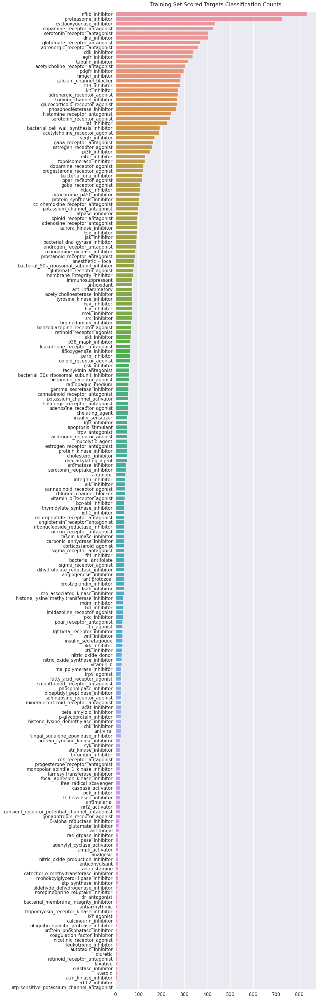

In [34]:
fig = plt.figure(figsize=(12, 60))

sns.barplot(x=df_train[target_features_scored].sum(axis=0).sort_values(ascending=False).values,
            y=df_train[target_features_scored].sum(axis=0).sort_values(ascending=False).index)

plt.tick_params(axis='x', labelsize=15)
plt.tick_params(axis='y', labelsize=15)
plt.xlabel('')
plt.ylabel('')
plt.title('Training Set Scored Targets Classification Counts', size=18, pad=18)

plt.show()

#### 2.4.2 Nonscored Targets

The most commmonly classified non-scored targets are `ace inhibitor`, `purinergic receptor antagonist`, `map kinase inhibitor`, `sterol demethylase inhibitor`, and there are more than 70 samples classified to each of them. There are 71 non-scored targets that are classified to 0 samples. The classification counts of non-scored targets are very different than scored targets because most of the training samples are not classified to any of them.

**Targets classified same number of times is more significant in non-scored targets and they are more likely to be in a relationship.**

In [35]:
df_train[target_features_nonscored].sum(axis=0).sort_values(ascending=False)

ace_inhibitor                     91
purinergic_receptor_antagonist    78
map_kinase_inhibitor              74
sterol_demethylase_inhibitor      72
bone_resorption_inhibitor         67
                                  ..
src_activator                      0
cysteine_peptidase_inhibitor       0
noradrenaline_uptake_inhibitor     0
cell_proliferation_inhibitor       0
ntpdase_inhibitor                  0
Length: 402, dtype: int64

In [36]:
df_train[target_features_nonscored].sum(axis=0).sort_values(ascending=False)[df_train[target_features_nonscored].sum(axis=0).sort_values(ascending=False).values==0]

cardiac_glycoside                               0
glutathione_peroxidase_agonist                  0
adenosine_deaminase_inhibitor                   0
transient_receptor_potential_channel_agonist    0
trail_modulator                                 0
                                               ..
src_activator                                   0
cysteine_peptidase_inhibitor                    0
noradrenaline_uptake_inhibitor                  0
cell_proliferation_inhibitor                    0
ntpdase_inhibitor                               0
Length: 71, dtype: int64

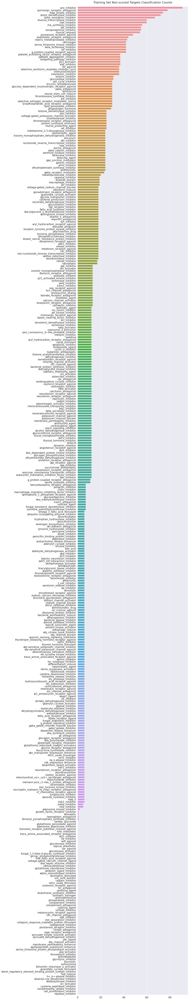

In [37]:
fig = plt.figure(figsize=(12, 110))

sns.barplot(x=df_train[target_features_nonscored].sum(axis=0).sort_values(ascending=False).values,
            y=df_train[target_features_nonscored].sum(axis=0).sort_values(ascending=False).index)

plt.tick_params(axis='x', labelsize=15)
plt.tick_params(axis='y', labelsize=15)
plt.xlabel('')
plt.ylabel('')
plt.title('Training Set Non-scored Targets Classification Counts', size=18, pad=18)

plt.show()

#### 2.4.3 Target Correlation

Both scored target and non-scored target correlations are very close to 0, but there are very few bright red and light red dots that are worth exploring. Those red dots may yield relationships between targets. Horizontal and vertical white lines in non-scored target correlations occur due to NaNs.

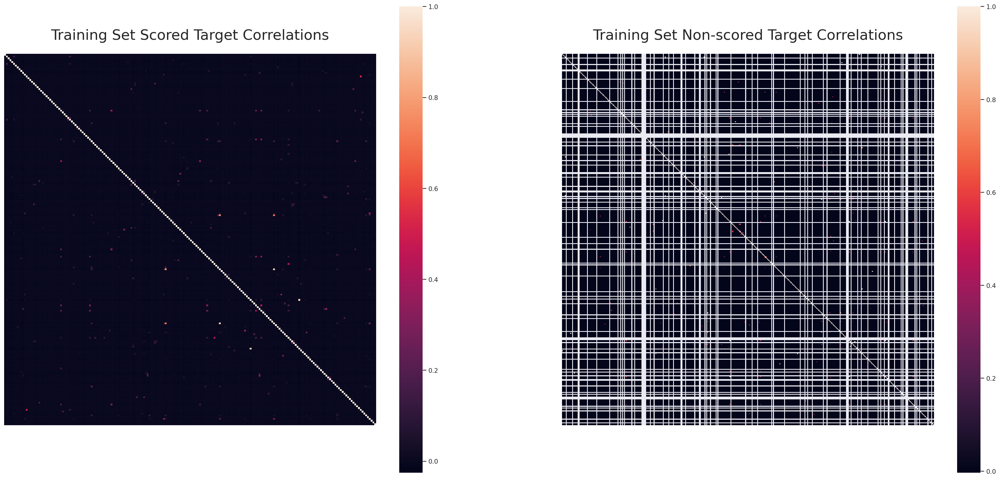

In [38]:
fig, axes = plt.subplots(figsize=(32, 15), ncols=2, dpi=150)

sns.heatmap(df_train[target_features_scored].corr(),
            annot=False,
            square=True,
           # cmap="YlGnBu",
            cbar=True,
            yticklabels=False,
            xticklabels=False,
            ax=axes[0])  

sns.heatmap(df_train[target_features_nonscored].corr(),
            annot=False,
            square=True,
           # cmap="YlGnBu",
            cbar=True,
            yticklabels=False,
            xticklabels=False,
            ax=axes[1])   

axes[0].set_title('Training Set Scored Target Correlations', size=25, pad=25)
axes[1].set_title('Training Set Non-scored Target Correlations', size=25, pad=25)

plt.show()

### 2.5 Features vs Targets

#### 2.5.1 Scored targets vs Numerical features

In [39]:
columns=g_list+c_list
correlation_matrix = pd.DataFrame()

for t_col in train_target_scored.columns:
    corr_list = list()
    if t_col == 'sig_id':
        continue
    for col in columns:
        res = train[col].corr(train_target_scored[t_col])
        corr_list.append(res)
    correlation_matrix[t_col] = corr_list

In [40]:
correlation_matrix['train_features'] = columns
correlation_matrix = correlation_matrix.set_index('train_features')

correlation_matrix

,5-alpha_reductase_inhibitor,11-beta-hsd1_inhibitor,acat_inhibitor,acetylcholine_receptor_agonist,acetylcholine_receptor_antagonist,acetylcholinesterase_inhibitor,adenosine_receptor_agonist,adenosine_receptor_antagonist,adenylyl_cyclase_activator,adrenergic_receptor_agonist,adrenergic_receptor_antagonist,akt_inhibitor,aldehyde_dehydrogenase_inhibitor,alk_inhibitor,ampk_activator,analgesic,androgen_receptor_agonist,androgen_receptor_antagonist,anesthetic_-_local,angiogenesis_inhibitor,angiotensin_receptor_antagonist,anti-inflammatory,antiarrhythmic,antibiotic,anticonvulsant,antifungal,antihistamine,antimalarial,antioxidant,antiprotozoal,antiviral,apoptosis_stimulant,aromatase_inhibitor,atm_kinase_inhibitor,atp-sensitive_potassium_channel_antagonist,atp_synthase_inhibitor,atpase_inhibitor,atr_kinase_inhibitor,aurora_kinase_inhibitor,autotaxin_inhibitor,bacterial_30s_ribosomal_subunit_inhibitor,bacterial_50s_ribosomal_subunit_inhibitor,bacterial_antifolate,bacterial_cell_wall_synthesis_inhibitor,bacterial_dna_gyrase_inhibitor,bacterial_dna_inhibitor,bacterial_membrane_integrity_inhibitor,bcl_inhibitor,bcr-abl_inhibitor,benzodiazepine_receptor_agonist,beta_amyloid_inhibitor,bromodomain_inhibitor,btk_inhibitor,calcineurin_inhibitor,calcium_channel_blocker,cannabinoid_receptor_agonist,cannabinoid_receptor_antagonist,carbonic_anhydrase_inhibitor,casein_kinase_inhibitor,caspase_activator,catechol_o_methyltransferase_inhibitor,cc_chemokine_receptor_antagonist,cck_receptor_antagonist,cdk_inhibitor,chelating_agent,chk_inhibitor,chloride_channel_blocker,cholesterol_inhibitor,cholinergic_receptor_antagonist,coagulation_factor_inhibitor,corticosteroid_agonist,cyclooxygenase_inhibitor,cytochrome_p450_inhibitor,dihydrofolate_reductase_inhibitor,dipeptidyl_peptidase_inhibitor,diuretic,dna_alkylating_agent,dna_inhibitor,dopamine_receptor_agonist,dopamine_receptor_antagonist,egfr_inhibitor,elastase_inhibitor,erbb2_inhibitor,estrogen_receptor_agonist,estrogen_receptor_antagonist,faah_inhibitor,farnesyltransferase_inhibitor,fatty_acid_receptor_agonist,fgfr_inhibitor,flt3_inhibitor,focal_adhesion_kinase_inhibitor,free_radical_scavenger,fungal_squalene_epoxidase_inhibitor,gaba_receptor_agonist,gaba_receptor_antagonist,gamma_secretase_inhibitor,glucocorticoid_receptor_agonist,glutamate_inhibitor,glutamate_receptor_agonist,glutamate_receptor_antagonist,gonadotropin_receptor_agonist,gsk_inhibitor,hcv_inhibitor,hdac_inhibitor,histamine_receptor_agonist,histamine_receptor_antagonist,histone_lysine_demethylase_inhibitor,histone_lysine_methyltransferase_inhibitor,hiv_inhibitor,hmgcr_inhibitor,hsp_inhibitor,igf-1_inhibitor,ikk_inhibitor,imidazoline_receptor_agonist,immunosuppressant,insulin_secretagogue,insulin_sensitizer,integrin_inhibitor,jak_inhibitor,kit_inhibitor,laxative,leukotriene_inhibitor,leukotriene_receptor_antagonist,lipase_inhibitor,lipoxygenase_inhibitor,lxr_agonist,mdm_inhibitor,mek_inhibitor,membrane_integrity_inhibitor,mineralocorticoid_receptor_antagonist,monoacylglycerol_lipase_inhibitor,monoamine_oxidase_inhibitor,monopolar_spindle_1_kinase_inhibitor,mtor_inhibitor,mucolytic_agent,neuropeptide_receptor_antagonist,nfkb_inhibitor,nicotinic_receptor_agonist,nitric_oxide_donor,nitric_oxide_production_inhibitor,nitric_oxide_synthase_inhibitor,norepinephrine_reuptake_inhibitor,nrf2_activator,opioid_receptor_agonist,opioid_receptor_antagonist,orexin_receptor_antagonist,p38_mapk_inhibitor,p-glycoprotein_inhibitor,parp_inhibitor,pdgfr_inhibitor,pdk_inhibitor,phosphodiesterase_inhibitor,phospholipase_inhibitor,pi3k_inhibitor,pkc_inhibitor,potassium_channel_activator,potassium_channel_antagonist,ppar_receptor_agonist,ppar_receptor_antagonist,progesterone_receptor_agonist,progesterone_receptor_antagonist,prostaglandin_inhibitor,prostanoid_receptor_antagonist,proteasome_inhibitor,protein_kinase_inhibitor,protein_phosphatase_inhibitor,protein_synthesis_inhibitor,protein_tyrosine_kinase_inhibitor,radiopaque_medium,raf_inhibitor,ras_gtpase_inhibitor,re

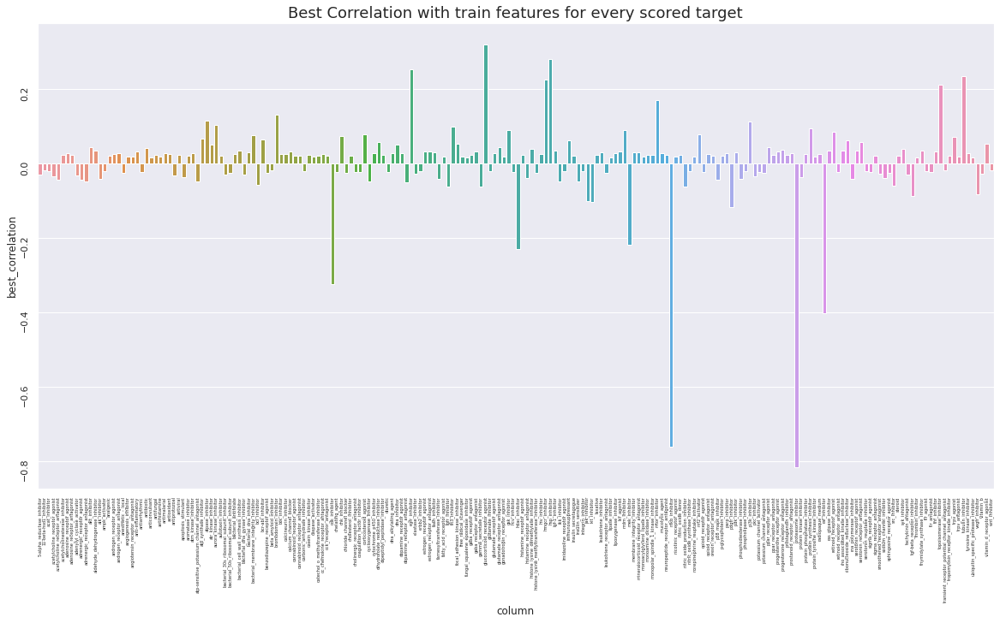

In [41]:

maxCol=lambda x: max(x.min(), x.max(), key=abs)

high_scores = correlation_matrix.apply(maxCol, axis=0).reset_index()

high_scores.columns = [
    'column', 
    'best_correlation'
]

plt.figure(figsize=(20,10))
plt.yticks(rotation=90)
plt.xticks(rotation=90)
plt.tick_params(axis='x', labelsize=5)
plt.title('Best Correlation with train features for every scored target',size=18)
sns.barplot(data=high_scores,x='column',y='best_correlation');

#fig = px.bar(
#    high_scores, 
#    x='column', 
#    y="best_correlation", 
#    orientation='v', 
#    title='Best correlation with train columns for every target column', 
#    width=1200,
 #   height=800
#)

#fig.show()

**Cell viablity vs Scored targets**


Cell viability features are plotted against only a random target feature since there are 206 targets. It can be seen that, there are positive relationships between cell viability features and target features in most of the cases. However, some of them have no relationship or negative relationship with target features. This could be related to, most of the cells are being cancer cells while some of them are not. Another pattern that can be seen in cell viability features is, positive target values are clustered around zero means in most of the cases.

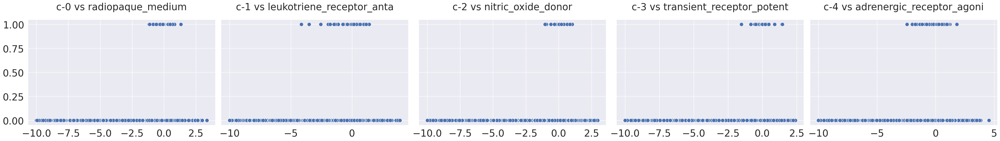

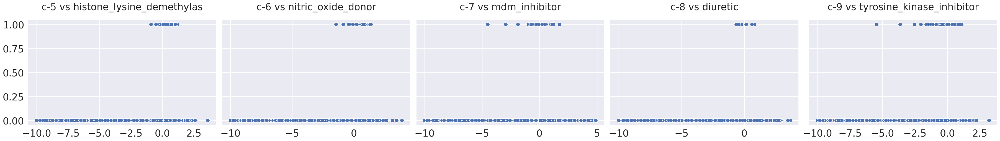

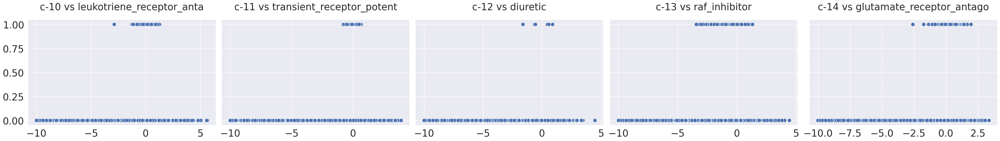

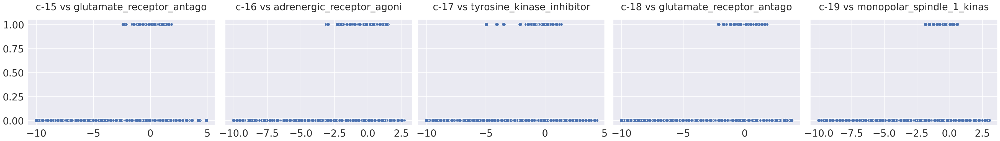

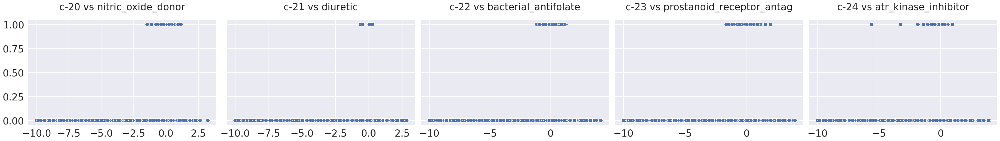

...

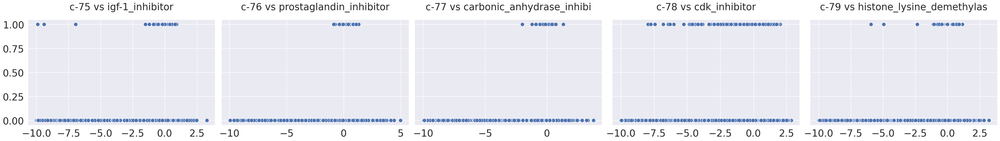

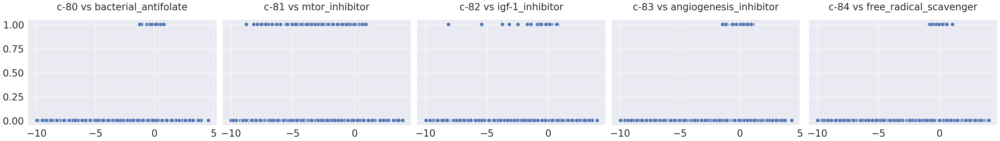

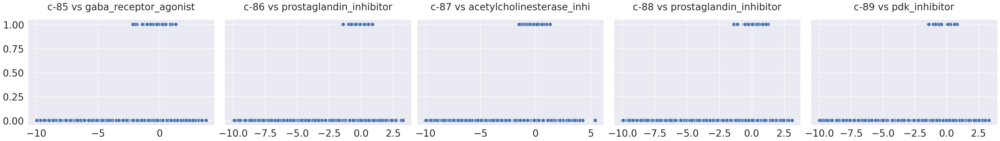

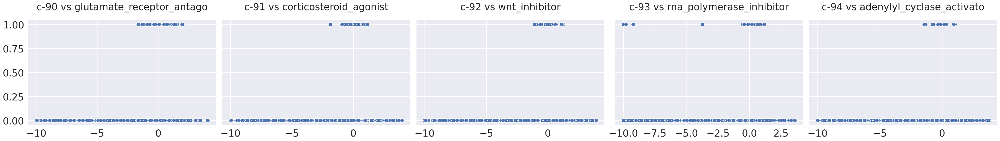

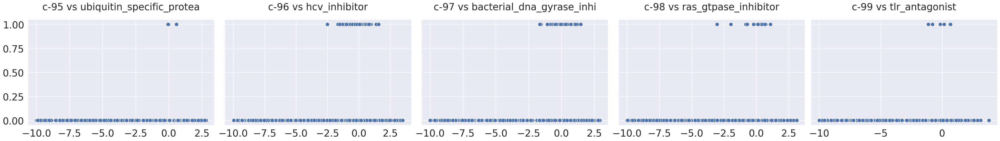

In [42]:
def scatterplot_cfeature(feature_group, seeds):
        
    fig, axes = plt.subplots(ncols=5, figsize=(36, 5), dpi=100, constrained_layout=True)
    title_size = 25
    label_size = 25

    for i, feature in enumerate(feature_group):
        
        np.random.seed(seeds[i])
        target = np.random.choice(target_features_scored)
        if len(target) > 25:
            target_title = target[:25]
        else:
            target_title = target
            
        sns.scatterplot(df_train[feature], df_train[target], s=100, ax=axes[i])
        axes[i].set_xlabel('')
        axes[i].set_ylabel('')
        axes[i].tick_params(axis='x', labelsize=label_size)
        axes[i].tick_params(axis='y', labelsize=label_size)
        
        for label in axes[i].get_yticklabels():
            if i % 5 == 0:
                label.set_visible(True)
            else:
                label.set_visible(False)
                
        axes[i].set_title(f'{feature} vs {target_title}', size=title_size, pad=title_size)
    
    plt.show()
    
for i, feature_group in enumerate(np.array_split(c_list, len(c_list) // 5), 2):
    scatterplot_cfeature(feature_group, seeds=np.arange(1, 6) * i)

**Gene Expression vs Scored targets**


Random gene expression features are plotted against a random target feature because it is not possible to visualize 772x206 feature interactions. Gene expression features and targets have weaker relationships compared to cell viability features, because data points of positive target values are more spread along the x axis.

All gene expression features have one thing in common; positive target values are clustered around zero means just like cell viability features. High absolute values in gene expression features (>2 or <-2) indicate that the drug or perturbation had a significant effect on the current cell, whereas values close to zero mean means that the effect for that cell was non-measurable.

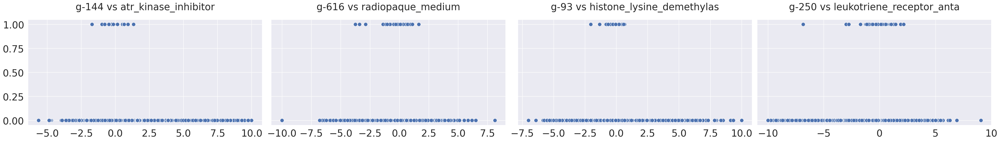

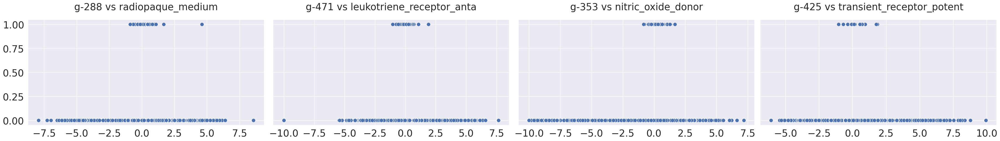

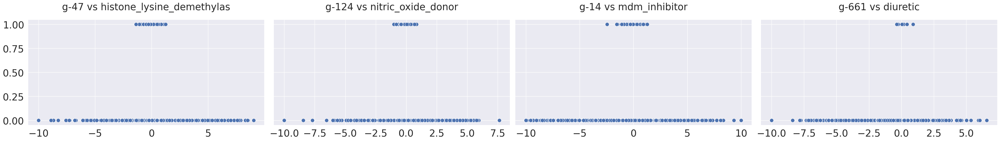

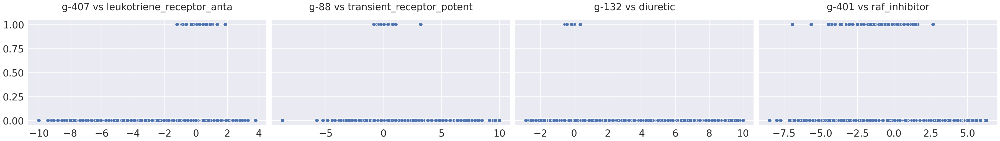

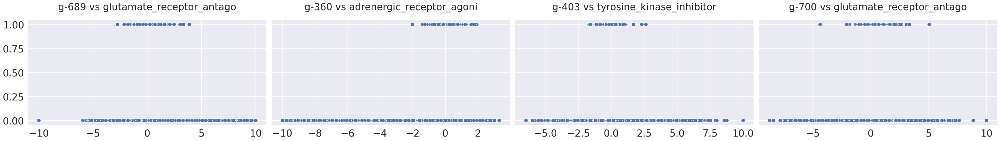

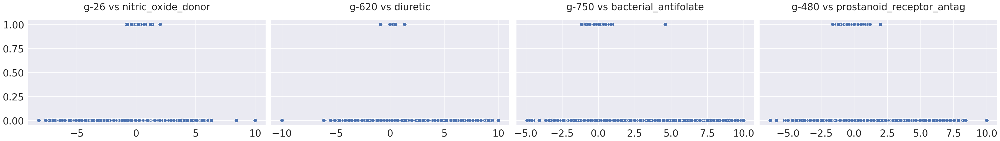

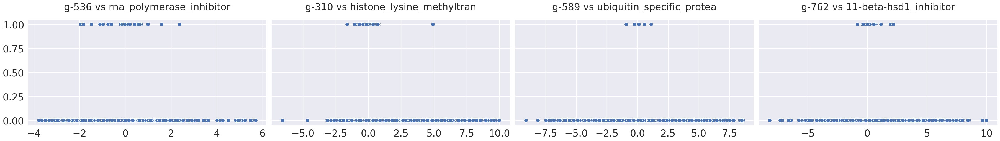

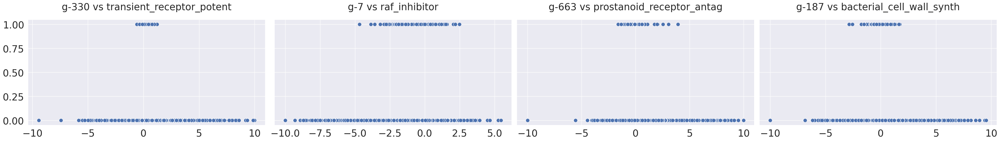

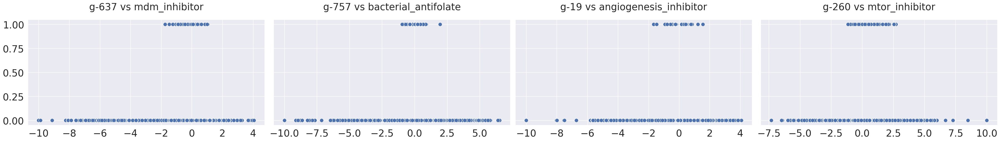

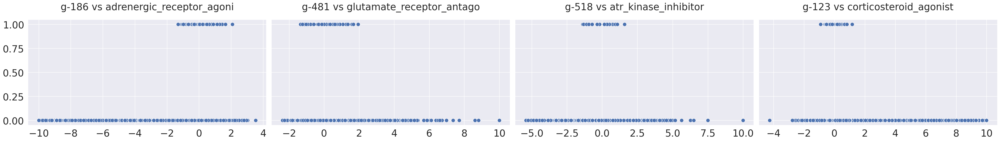

In [43]:
def scatterplot_gfeature(feature_group, seeds):
        
    fig, axes = plt.subplots(ncols=4, figsize=(36, 5), dpi=100, constrained_layout=True)
    title_size = 25
    label_size = 25

    for i, feature in enumerate(feature_group):
                
        np.random.seed(seeds[i])
        target = np.random.choice(target_features_scored)
        if len(target) > 25:
            target_title = target[:25]
        else:
            target_title = target
            
        sns.scatterplot(df_train[feature], df_train[target], s=100, ax=axes[i])
        axes[i].set_xlabel('')
        axes[i].set_ylabel('')
        axes[i].tick_params(axis='x', labelsize=label_size)
        axes[i].tick_params(axis='y', labelsize=label_size)
        
        for label in axes[i].get_yticklabels():
            if i % 5 == 0:
                label.set_visible(True)
            else:
                label.set_visible(False)
                
        axes[i].set_title(f'{feature} vs {target_title}', size=title_size, pad=title_size)
    
    plt.show()
    
shuffled_g_features = np.copy(g_list)
np.random.shuffle(shuffled_g_features)
for i, feature_group in enumerate(np.array_split(shuffled_g_features, len(shuffled_g_features) // 4)[:10], 1):
    scatterplot_gfeature(feature_group, seeds=np.arange(1, 6) * i)

#### 2.5.2 Nonscored targets vs Numerical features

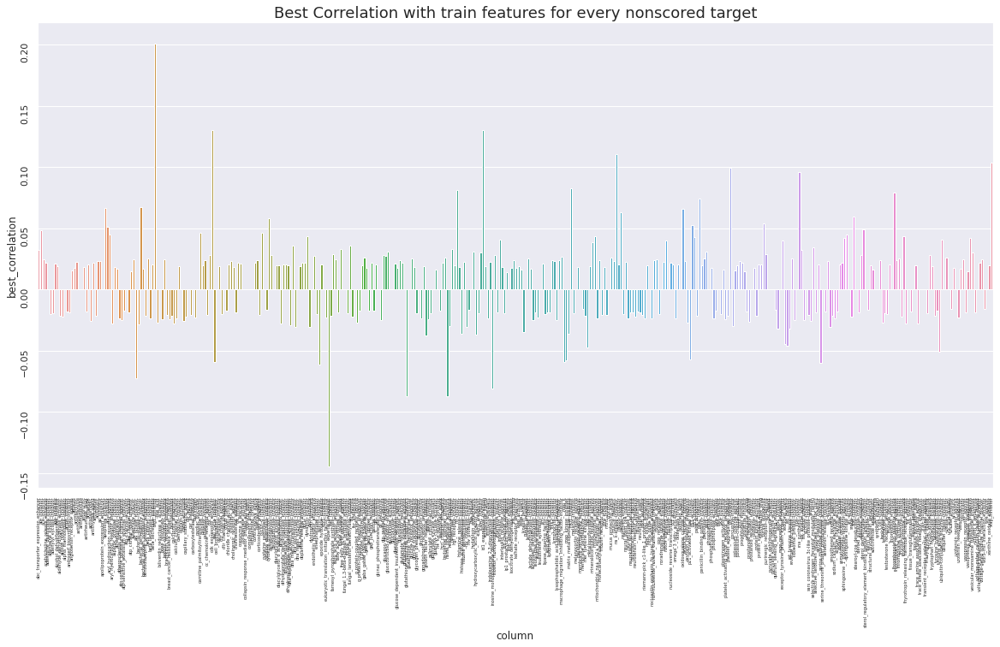

In [44]:
# do the same for nonscored targets
columns=g_list+c_list
correlation_matrix = pd.DataFrame()

for t_col in train_target_nonscored.columns:
    corr_list = list()
    if t_col == 'sig_id':
        continue
    for col in columns:
        res = train[col].corr(train_target_nonscored[t_col])
        corr_list.append(res)
    correlation_matrix[t_col] = corr_list
    
correlation_matrix['train_features'] = columns
correlation_matrix = correlation_matrix.set_index('train_features')

correlation_matrix

maxCol=lambda x: max(x.min(), x.max(), key=abs)

high_scores = correlation_matrix.apply(maxCol, axis=0).reset_index()

high_scores.columns = [
    'column', 
    'best_correlation'
]

plt.figure(figsize=(20,10))
plt.yticks(rotation=90)
plt.xticks(rotation=90)
plt.tick_params(axis='x', labelsize=5)
plt.title('Best Correlation with train features for every nonscored target',size=18)
sns.barplot(data=high_scores,x='column',y='best_correlation');

In [2]:
402+206

608